In [1]:
import pandas as pd
import numpy as np
import datetime
from datetime import datetime as dt
import math
import matplotlib.pyplot as plt
import matplotlib as mpl

In [2]:
df = pd.read_csv(r"C:\Users\ds221k10134\Downloads\個人探究\2月データ_ダミー.csv", encoding='utf-8-sig', thousands=',')
df["date"] = pd.to_datetime(df["date"])
df["year"] = df['date'].dt.year
df["month"] = df['date'].dt.month
df

,date,平均気温(℃),最低気温(℃),降水量の合計(mm),平均蒸気圧(hPa),平均湿度(％),日照時間(時間),降雪量合計(cm),大雪ダミー,降雪ダミー,year,month
0,1961-12-01,7.2,-1.9,40.5,6.0,58,202.6,0,0,0,1961,12
1,1962-01-01,4.5,-3.8,40.5,4.4,52,210.7,0,0,0,1962,1
2,1962-02-01,5.9,-2.6,13.5,4.5,48,195.0,0,0,0,1962,2
3,1962-03-01,8.2,-0.8,65.5,6.3,58,189.8,0,0,0,1962,3
4,1962-12-01,7.0,-0.3,62.8,6.1,62,175.8,0,0,0,1962,12
...,...,...,...,...,...,...,...,...,...,...,...,...
247,2023-03-01,12.9,3.6,145.0,10.2,68,164.1,0,0,0,2023,3
248,2023-12-01,9.4,0.1,19.5,7.2,59,199.1,0,0,0,2023,12
249,2024-01-01,7.1,-1.1,36.0,5.5,54,198.5,0,0,0,2024,1
250,2024-02-01,8.0,-0.1,78.5,6.9,63,152.4,9,0,1,2024,2


In [3]:
# 標準化器のインスタンス化
from sklearn.preprocessing import StandardScaler # ★★★ これを追加 ★★★

features_for_pca = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)','降雪量合計(cm)']
continuous_features = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)','降雪量合計(cm)']

scaler = StandardScaler()

# 連続値データのみを標準化
X_pca_scaled_continuous = scaler.fit_transform(df[continuous_features])
X_pca_scaled_df = pd.DataFrame(X_pca_scaled_continuous, columns=continuous_features, index=df.index)

'''binary_features = ["範囲"]

# 標準化しない2値データ列を元の値のまま結合
# もしbinary_featuresがfeatures_for_pcaに含まれている場合のみ結合
for b_feat in binary_features:
    if b_feat in features_for_pca:
        X_pca_scaled_df[b_feat] = df[b_feat]'''

# PCAに渡すデータフレームの列順をfeatures_for_pcaの順に合わせる
numeric_df = X_pca_scaled_df[features_for_pca]
numeric_df

,平均気温(℃),最低気温(℃),降水量の合計(mm),平均蒸気圧(hPa),平均湿度(％),日照時間(時間),降雪量合計(cm)
0,-0.088763,-0.859629,-0.586292,0.365546,0.865378,0.859179,-0.357021
1,-1.509814,-1.934557,-0.586292,-1.001692,-0.131917,1.143174,-0.357021
2,-0.772973,-1.255655,-1.154407,-0.916240,-0.796781,0.592714,-0.357021
3,0.437552,-0.237302,-0.060260,0.621904,0.865378,0.410396,-0.357021
4,-0.194026,0.045574,-0.117071,0.450999,1.530242,-0.080460,-0.357021
...,...,...,...,...,...,...,...
247,2.911233,2.252007,1.612523,3.954547,2.527537,-0.490675,-0.357021
248,1.069130,0.271875,-1.028159,1.390975,1.031594,0.736465,-0.357021
249,-0.141395,-0.407027,-0.680978,-0.061716,0.200514,0.715428,-0.357021
250,0.332289,0.158725,0.213277,1.134618,1.696458,-0.900890,0.794792


In [4]:
# 標準化器のインスタンス化
from sklearn.preprocessing import StandardScaler # ★★★ これを追加 ★★★

features_for_pca = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)']
continuous_features = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)']

scaler = StandardScaler()

# 連続値データのみを標準化
X_pca_scaled_continuous = scaler.fit_transform(df[continuous_features])
X_pca_scaled_df = pd.DataFrame(X_pca_scaled_continuous, columns=continuous_features, index=df.index)

'''binary_features = ["範囲"]

# 標準化しない2値データ列を元の値のまま結合
# もしbinary_featuresがfeatures_for_pcaに含まれている場合のみ結合
for b_feat in binary_features:
    if b_feat in features_for_pca:
        X_pca_scaled_df[b_feat] = df[b_feat]'''

# PCAに渡すデータフレームの列順をfeatures_for_pcaの順に合わせる
numeric_df2 = X_pca_scaled_df[features_for_pca]
numeric_df2

,平均気温(℃),最低気温(℃),降水量の合計(mm),平均蒸気圧(hPa),平均湿度(％),日照時間(時間)
0,-0.088763,-0.859629,-0.586292,0.365546,0.865378,0.859179
1,-1.509814,-1.934557,-0.586292,-1.001692,-0.131917,1.143174
2,-0.772973,-1.255655,-1.154407,-0.916240,-0.796781,0.592714
3,0.437552,-0.237302,-0.060260,0.621904,0.865378,0.410396
4,-0.194026,0.045574,-0.117071,0.450999,1.530242,-0.080460
...,...,...,...,...,...,...
247,2.911233,2.252007,1.612523,3.954547,2.527537,-0.490675
248,1.069130,0.271875,-1.028159,1.390975,1.031594,0.736465
249,-0.141395,-0.407027,-0.680978,-0.061716,0.200514,0.715428
250,0.332289,0.158725,0.213277,1.134618,1.696458,-0.900890


In [14]:
#df3 = df[umap_result_df["MeanShiftCluster"]==1]
df3 = df[df["降雪ダミー"]==1]

#df5 = df[umap_result_df["MeanShiftCluster"]==0]
df5 = df[df["降雪ダミー"]==0]

In [15]:
df3

,date,平均気温(℃),最低気温(℃),降水量の合計(mm),平均蒸気圧(hPa),平均湿度(％),日照時間(時間),降雪量合計(cm),大雪ダミー,降雪ダミー,year,month
7,1963-03-01,7.6,-2.1,86.7,6.3,59,198.8,8,0,1,1963,3
10,1964-02-01,4.2,-2.4,64.0,4.6,56,151.0,10,0,1,1964,2
13,1965-01-01,4.4,-3.3,48.0,4.8,57,175.4,11,0,1,1965,1
22,1967-02-01,4.9,-4.0,43.8,5.1,57,162.6,24,1,1,1967,2
26,1968-02-01,4.3,-2.9,48.0,3.7,44,205.8,30,1,1,1968,2
...,...,...,...,...,...,...,...,...,...,...,...,...
235,2020-03-01,10.7,0.7,131.0,8.4,65,181.9,1,0,1,2020,3
241,2022-01-01,4.9,-3.5,22.5,4.4,52,206.8,10,0,1,2022,1
242,2022-02-01,5.2,-1.9,71.0,4.6,53,190.9,2,0,1,2022,2
250,2024-02-01,8.0,-0.1,78.5,6.9,63,152.4,9,0,1,2024,2


In [16]:
df5

,date,平均気温(℃),最低気温(℃),降水量の合計(mm),平均蒸気圧(hPa),平均湿度(％),日照時間(時間),降雪量合計(cm),大雪ダミー,降雪ダミー,year,month
0,1961-12-01,7.2,-1.9,40.5,6.0,58,202.6,0,0,0,1961,12
1,1962-01-01,4.5,-3.8,40.5,4.4,52,210.7,0,0,0,1962,1
2,1962-02-01,5.9,-2.6,13.5,4.5,48,195.0,0,0,0,1962,2
3,1962-03-01,8.2,-0.8,65.5,6.3,58,189.8,0,0,0,1962,3
4,1962-12-01,7.0,-0.3,62.8,6.1,62,175.8,0,0,0,1962,12
...,...,...,...,...,...,...,...,...,...,...,...,...
245,2023-01-01,5.7,-3.4,15.5,5.2,55,195.0,0,0,0,2023,1
246,2023-02-01,7.3,-0.7,40.5,5.6,54,178.6,0,0,0,2023,2
247,2023-03-01,12.9,3.6,145.0,10.2,68,164.1,0,0,0,2023,3
248,2023-12-01,9.4,0.1,19.5,7.2,59,199.1,0,0,0,2023,12


In [ ]:
'''強い大雪と大雪の比較
有意水準5%で帰無仮説が棄却された（=有意な差があった）特徴量:
・特徴量: 降水量の合計(mm)　強い大雪の方が降水量が多い(120mm帯)
  p値: 0.0162
・特徴量: 平均湿度(％) 強い大雪の方が湿度が高い(50%帯)
  p値: 0.0473
・特徴量: 降雪量合計(cm)
  p値: 0.0020

In [224]:
df[(df['降水量の合計(mm)'] >= 120) & (df['平均湿度(％)'] >= 50) & (df['平均湿度(％)'] < 60)]

,date,平均気温(℃),最低気温(℃),降水量の合計(mm),平均蒸気圧(hPa),平均湿度(％),日照時間(時間),降雪量合計(cm),大雪ダミー,降雪ダミー,year,month
18,1966-02-01,7.2,-3.2,122.0,5.5,51,149.6,0,0,0,1966,2
28,1968-12-01,10.2,1.1,188.0,7.6,59,137.2,0,0,0,1968,12
31,1969-03-01,7.9,-1.5,121.0,6.4,58,179.3,54,1,1,1969,3
42,1972-02-01,5.1,-1.5,142.0,5.1,58,112.6,13,0,1,1972,2
44,1972-12-01,8.1,0.0,155.5,6.1,56,161.6,0,0,0,1972,12
45,1973-01-01,6.3,-0.4,136.0,5.3,55,177.6,0,0,0,1973,1
58,1976-02-01,6.8,-2.8,128.0,6.2,59,137.3,1,0,1,1976,2
75,1980-03-01,8.2,1.3,173.5,6.0,54,157.5,1,0,1,1980,3
94,1985-02-01,6.5,-1.3,142.0,5.6,58,153.2,0,0,0,1985,2
99,1986-03-01,7.8,0.0,188.0,6.2,59,161.5,10,0,1,1986,3


In [18]:
from scipy import stats
feature_value = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)','降雪量合計(cm)']

print("有意水準5%で帰無仮説が棄却された（=有意な差があった）特徴量:")

# 各特徴量についてループ処理
for feature in feature_value:
    # データフレームにその特徴量が存在するかを確認
    if feature not in df3.columns or feature not in df5.columns:
        # print(f"特徴量 '{feature}' はデータに含まれていません。") # スキップしたことを確認したい場合
        continue

    # 欠損値を除いたデータ数が2未満の場合や、データにばらつきがない場合はt検定ができないためスキップ
    if df3[feature].count() < 2 or df5[feature].count() < 2 or (df3[feature].std() == 0 and df5[feature].std() == 0):
        continue

    # 独立2標本t検定を実行 (Student's t-test)
    # equal_var=True は2群の分散が等しいことを仮定します。仮定できない場合は False (Welch's t-test) を指定します。
    # nan_policy='omit' は計算前に欠損値を自動的に除外します。
    t_value, p_value = stats.ttest_ind(df3[feature], df5[feature], equal_var=True, nan_policy='omit')

    # p値が有意水準0.05より小さい場合（統計的に有意な差がある場合）に結果を出力
    if p_value < 0.05:
        print(f"・特徴量: {feature}")
        print(f"  p値: {p_value:.4f}")

有意水準5%で帰無仮説が棄却された（=有意な差があった）特徴量:
・特徴量: 平均気温(℃)
  p値: 0.0000
・特徴量: 最低気温(℃)
  p値: 0.0000
・特徴量: 平均蒸気圧(hPa)
  p値: 0.0002
・特徴量: 日照時間(時間)
  p値: 0.0124
・特徴量: 降雪量合計(cm)
  p値: 0.0000


In [182]:
from scipy import stats
feature_value = "日照時間(時間)"
# 標本数
m = df3[f'{feature_value}'].count()
n = df5[f'{feature_value}'].count()
# 標本平均
mean_3 =  df3[f'{feature_value}'].mean()
mean_5 =  df5[f'{feature_value}'].mean()
# 標本分散
var_3 =  df3[f'{feature_value}'].var()
var_5 =  df5[f'{feature_value}'].var()
# 不偏分散
dvar_3 =  df3[f'{feature_value}'].var(ddof=1)
dvar_5 =  df5[f'{feature_value}'].var(ddof=1)
# 標本標準偏差
std_3 =  df3[f'{feature_value}'].std()
std_5 =  df5[f'{feature_value}'].std()
# 自由度
dof = m + n - 2
 
print("mean_3:", mean_3)
print("mean_5:", mean_5)
print("var_3: ", var_3)
print("var_5: ", var_5)
print("dvar_3: ", dvar_3)
print("dvar_5: ", dvar_5)
print("std_3: ", std_3)  # np.sqrt(var_X)
print("std_5: ", std_5)  # np.sqrt(var_Y)
print("dof: ", dof)

mean_3: 172.60000000000002
mean_5: 190.36666666666665
var_3:  844.3933333333334
var_5:  359.45866666666666
dvar_3:  844.3933333333334
dvar_5:  359.45866666666666
std_3:  29.0584468499838
std_5:  18.959395208356902
dof:  8


In [183]:
import math
print("df3_kurt:",df3[f'{feature_value}'].kurt())
print("df5_kurt:",df5[f'{feature_value}'].kurt())

df3_kurt: -0.0025458583570490134
df5_kurt: -0.6107770138818145


In [184]:
from scipy import stats
# 推定した分散
v = ((m - 1) * dvar_3 + (n - 1) * dvar_5) / (m + n - 2)
print("v:", v)
 
# 推定した標準偏差
s = np.sqrt(v)
print("s:", s)
 
# 標準誤差
se = np.sqrt(v/m + v/n)
print("se:", se)
 
# t値（2標本t統計量）の算出
t_value = (mean_3 - mean_5) / se
# t_value = (mean_X - mean_Y) / (s * np.sqrt(1/m + 1/n))  # 上式と同じ
print("t_value:", t_value)
 
# p値の算出
p_value = min(stats.t.cdf(t_value, dof), 1-stats.t.cdf(t_value, dof)) * 2
print("p_value:", p_value)

v: 541.3091666666667
s: 23.266051806584343
se: 15.018171863150027
t_value: -1.1830112765096634
p_value: 0.27076663577374144


In [185]:
t_value, p_value = stats.ttest_ind(df3[f'{feature_value}'], df5[f'{feature_value}'], equal_var=True)
print("t_value:", t_value)
print("p_value:", p_value)

if p_value < 0.025:
    print(f"p = {p_value:.3f} のため、帰無仮説が棄却されました。AとBに差があります")
else:
    print(f"{p_value:.3f} のため、帰無仮説が採択されました。AとBに差はありません")

t_value: -1.1830112765096636
p_value: 0.2707666357737414
0.271 のため、帰無仮説が採択されました。AとBに差はありません


In [4]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import umap.umap_ as umap
import plotly.express as px
import plotly.io as pio

# Plotlyのレンダラー設定 (Jupyter環境でインタラクティブなグラフを表示するため)
pio.renderers.default = "notebook" # または "jupyterlab", "vscode" など

# --- データの準備 ---
original_features = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)']

# --- 1. PCAの実行と主成分の抽出（累積寄与率80%まで） ---

# まず、すべての主成分を計算
pca = PCA()
pca.fit(numeric_df) # 標準化済みのデータを使用

# 各主成分の寄与率と累積寄与率を計算
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio)

print("各主成分の寄与率:")
for i, ratio in enumerate(explained_variance_ratio):
    print(f"  PC{i+1}: {ratio:.4f} ({cumulative_explained_variance_ratio[i]:.4f} 累積)")

# 累積寄与率が80%を最初に上回る主成分の数を特定
n_components_pca = np.where(cumulative_explained_variance_ratio >= 0.75)[0][0] + 1
print(f"\n累積寄与率が80%を最初に上回る主成分の数: {n_components_pca} 個")
print(f"この {n_components_pca} 個の主成分による累積寄与率: {cumulative_explained_variance_ratio[n_components_pca-1]:.4f}")

# 選択された主成分でPCAを再実行し、データを変換
pca_selected = PCA(n_components=n_components_pca)
pca_transformed_data = pca_selected.fit_transform(numeric_df)

# PCAの結果をDataFrameに変換（UMAPの入力用）
# 列名もPC1, PC2...とする
pca_df = pd.DataFrame(pca_transformed_data,
                      columns=[f'PC{i+1}' for i in range(n_components_pca)],
                      index=numeric_df.index)

# --- 2. UMAPの実行と2次元平面へのプロット ---

# PCAで抽出された主成分データをUMAPの入力として使用
reducer = umap.UMAP(n_components=2, # 2次元に削減
                     n_neighbors=15, # 近傍点の数（調整可能）
                     min_dist=0.1,   # 埋め込み空間での最小距離（調整可能）
                     random_state=42)

# UMAPを実行
umap_embedding = reducer.fit_transform(pca_df)

# UMAPの結果をDataFrameに変換
umap_result_df = pd.DataFrame(umap_embedding, columns=['UMAP_1', 'UMAP_2'], index=numeric_df.index)

# プロットに必要な追加情報（CharacterName, Categoryなど）を結合
umap_result_df = umap_result_df.merge(df[['date']], left_index=True, right_index=True)

# --- 結果のプロット (Plotly Express) ---
fig = px.scatter(umap_result_df,
                 x='UMAP_1',
                 y='UMAP_2',
                 hover_data={'date': True, 'UMAP_1': ':.2f', 'UMAP_2': ':.2f'}, # ホバーで表示する情報
                 title='UMAP Projection (from PCA-reduced Data) on 2D Plane',
                 labels={'UMAP_1': 'UMAP Component 1', 'UMAP_2': 'UMAP Component 2'},
                 height=700,
                 width=800
                )

fig.update_layout(
    xaxis_title='UMAP Component 1',
    yaxis_title='UMAP Component 2',
    hovermode='closest',
    font=dict(
        family="Yu Gothic, Meiryo, sans-serif", # 日本語フォント指定
        size=12
    )
)

fig.show()

各主成分の寄与率:
  PC1: 0.5111 (0.5111 累積)
  PC2: 0.2125 (0.7237 累積)
  PC3: 0.1125 (0.8362 累積)
  PC4: 0.0772 (0.9134 累積)
  PC5: 0.0651 (0.9785 累積)
  PC6: 0.0203 (0.9988 累積)
  PC7: 0.0012 (1.0000 累積)

累積寄与率が80%を最初に上回る主成分の数: 3 個
この 3 個の主成分による累積寄与率: 0.8362


C:\Users\ds221k10134\Downloads\個人探究\venv_analysis\lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [43]:
# Plotlyのレンダラー設定 (Jupyter環境でインタラクティブなグラフを表示するため)
pio.renderers.default = "notebook" # または "jupyterlab", "vscode" など

# --- データの準備 ---
original_features = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)']

# --- 1. PCAの実行と主成分の抽出（累積寄与率80%まで） ---

# まず、すべての主成分を計算
pca = PCA()
pca.fit(numeric_df) # 標準化済みのデータを使用

# 選択された主成分でPCAを再実行し、データを変換
pca_selected = PCA(n_components=2)
pca_transformed_data = pca_selected.fit_transform(numeric_df)

# PCAの結果をDataFrameに変換（UMAPの入力用）
# 列名もPC1, PC2...とする
pca_df = pd.DataFrame(pca_transformed_data,
                      columns=[f'PC{i+1}' for i in range(2)],
                      index=numeric_df.index)

pca_df['降雪量合計(cm)'] = df['降雪量合計(cm)']

# 4. Plotlyで散布図を描画
# x軸に'PC1', y軸に'PC2'を指定します
fig = px.scatter(
    pca_df, 
    x='PC1', 
    y='PC2',
    title='PCA of Iris Dataset',
    labels={'PC1': '第一主成分 (PC1)', 'PC2': '第二主成分 (PC2)'},
    hover_data=['降雪量合計(cm)']
)

fig.show()

--- 主成分負荷量 ---
                 PC1       PC2
平均気温(℃)     0.436584  0.465477
最低気温(℃)     0.377729  0.486737
降水量の合計(mm)  0.388573 -0.230192
平均蒸気圧(hPa)  0.504998  0.081442
平均湿度(％)     0.412085 -0.407973
日照時間(時間)   -0.301479  0.565999


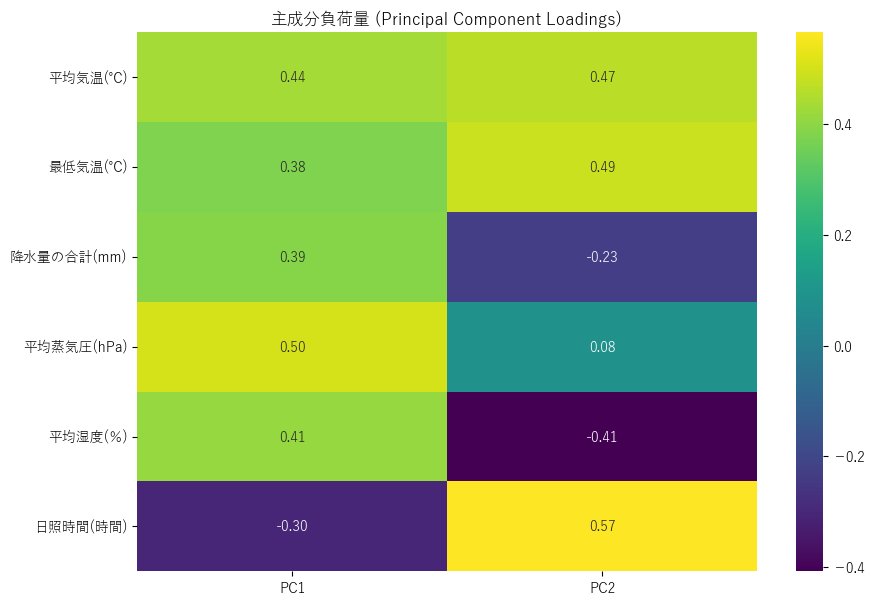

In [41]:

mpl.rcParams['font.family'] = 'Yu Gothic'

original_features_actual = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)']

# --- PCAの実行部分（変更なし）---
pca_selected = PCA(n_components=2)
pca_selected.fit(numeric_df2) # fitの実行だけでもcomponents_は計算されます




# --- 主成分負荷量の計算（ここを修正）---

# pca_selected.components_ をDataFrameに変換して見やすくする
# indexには手入力のリストではなく、分析に使ったDataFrameの列名を直接指定する
loadings_df = pd.DataFrame(
    pca_selected.components_.T,  # .T で転置する
    columns=['PC1', 'PC2'],       # 列名を主成分に
    index=numeric_df2.columns     # ★★★ 修正点 ★★★: 'original_features' から 'numeric_df.columns' へ変更
)

print("--- 主成分負荷量 ---")
print(loadings_df)

# (任意) 可視化
import matplotlib.pyplot as plt
import seaborn as sns
# 日本語フォント設定
# from matplotlib import rcParams
# rcParams['font.family'] = 'sans-serif'
# rcParams['font.sans-serif'] = ['Hiragino Maru Gothic Pro', 'Yu Gothic', 'Meirio']

plt.figure(figsize=(10, 7))
sns.heatmap(loadings_df, annot=True, cmap='viridis', fmt='.2f')
plt.title('主成分負荷量 (Principal Component Loadings)')
plt.show()

In [17]:
pca_df

,PC1,PC2
0,-0.263076,-0.100867
1,-2.475518,0.370285
2,-2.166848,-0.305524
3,0.666230,-0.175449
4,0.797823,0.410490
...,...,...
247,5.952337,-0.619180
248,1.135395,-0.992052
249,-0.588645,-0.441075
250,1.702302,1.311758


In [81]:
umap_result_df

,UMAP_1,UMAP_2,date
0,1.235051,4.061361,1961-12-01
1,-1.341908,1.307321,1962-01-01
2,-1.323072,1.860021,1962-02-01
3,2.859021,5.251019,1962-03-01
4,3.014899,4.190057,1962-12-01
...,...,...,...
247,6.536445,5.600537,2023-03-01
248,3.441808,6.794331,2023-12-01
249,0.682259,4.251031,2024-01-01
250,4.988526,4.443418,2024-02-01


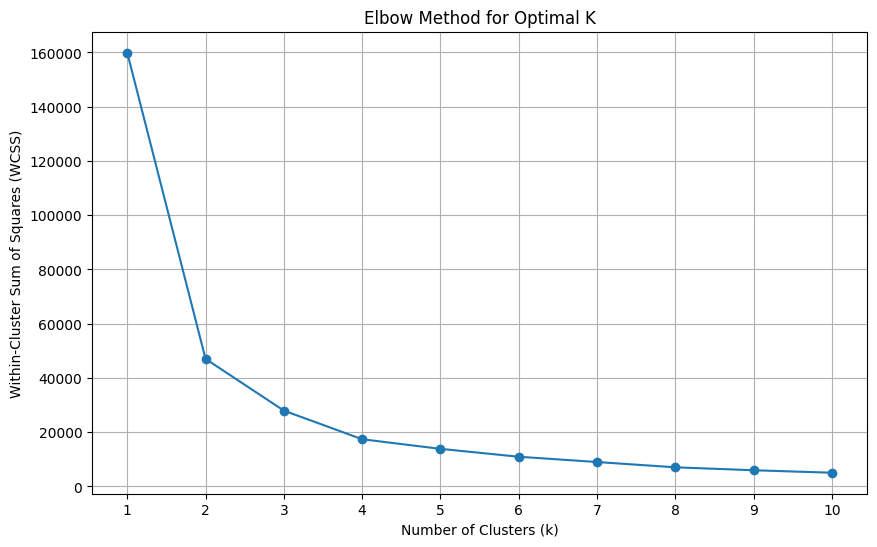


--- エルボー曲線から最適なKの判断 ---
上記のエルボー曲線を見て、グラフの傾きが急に緩やかになる点（肘のように見える点）を探してください。
その点が、データにとって最適なクラスター数 'k' である可能性が高いです。
例えば、k=3で大きくWCSSが減少し、k=4からは減少幅が小さくなる場合、k=3が最適な候補となります。
この方法は主観的な判断が含まれるため、他の評価指標（例: シルエット係数）と組み合わせて検討することが推奨されます。


In [6]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns # プロット用

# --- エルボー法の実行 ---

# K-meansクラスタリングに使用するデータ（UMAPの2次元成分のみ）
X_kmeans = umap_result_df[['UMAP_1', 'UMAP_2']]

# WCSS (Within-Cluster Sum of Squares) を格納するリスト
wcss = []

# 試行するクラスター数 k の範囲を定義
# 1から10または20程度まで試すのが一般的です。
# データ点の数や期待されるクラスター数に応じて調整してください。
k_range = range(1, 11) # 例として1から10まで試す

for k in k_range:
    # KMeansモデルを作成 (n_init='auto' は推奨設定)
    # random_state を設定することで、毎回同じ結果が得られます
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_kmeans)
    # inertia_ はWCSSの値です
    wcss.append(kmeans.inertia_)

# --- エルボー曲線のプロット ---

plt.figure(figsize=(10, 6))
plt.plot(k_range, wcss, marker='o', linestyle='-')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(k_range) # x軸の目盛りを整数にする
plt.grid(True)
plt.show()

print("\n--- エルボー曲線から最適なKの判断 ---")
print("上記のエルボー曲線を見て、グラフの傾きが急に緩やかになる点（肘のように見える点）を探してください。")
print("その点が、データにとって最適なクラスター数 'k' である可能性が高いです。")
print("例えば、k=3で大きくWCSSが減少し、k=4からは減少幅が小さくなる場合、k=3が最適な候補となります。")
print("この方法は主観的な判断が含まれるため、他の評価指標（例: シルエット係数）と組み合わせて検討することが推奨されます。")

In [5]:
from sklearn.metrics.pairwise import euclidean_distances # ユークリッド距離計算用
import colorsys

# Plotlyのレンダラー設定
pio.renderers.default = "notebook"

# UMAPの結果DataFrame (umap_result_df) が既にJupyter環境に存在すると仮定
# また、kmeans_model (KMeansオブジェクト) も前のセルで作成されていると仮定します。
# もしこれらが存在しない場合は、前のセルを実行して作成してください。

# ----------------------------------------------------------------------
# ★★★重要★★★: 以下の部分は、前のK-meansクラスタリングのセルで
#                 KMeansモデルの学習とクラスターIDの割り当てが
#                 行われていることを前提としています。
#                 もしこのセルだけ実行する場合、以下の2行は必須です。
# クラスタリングに使用するデータ（UMAPの2次元成分のみ）
X_kmeans = umap_result_df[['UMAP_1', 'UMAP_2']]
kmeans_model = KMeans(n_clusters=4, random_state=42, n_init='auto')
kmeans_model.fit(X_kmeans)
umap_result_df['Cluster'] = kmeans_model.labels_
# ----------------------------------------------------------------------

# --- 1. 各データ点と所属クラスター重心との距離を計算 ---

# クラスターの中心座標を取得
cluster_centers_coords = kmeans_model.cluster_centers_

# 各データ点とその所属クラスター重心との距離を格納するリスト
distances_from_centroid = []

for index, row in umap_result_df.iterrows():
    cluster_id = row['Cluster']
    # データ点の座標
    point_coords = np.array([row['UMAP_1'], row['UMAP_2']])
    # 所属するクラスターの重心座標
    centroid_coords = cluster_centers_coords[cluster_id]

    # ユークリッド距離を計算
    distance = np.linalg.norm(point_coords - centroid_coords) # numpyのnorm関数でユークリッド距離を計算
    distances_from_centroid.append(distance)

# 計算した距離をumap_result_dfに新しい列として追加
umap_result_df['DistanceToCentroid'] = distances_from_centroid

# --- 2. 距離に基づいて点を塗り分けるための新しいカテゴリを作成 ---

# 距離が1.96以上の場合は「OutlierInCluster」とし、そうでない場合は「InCluster」とする
# この新しい列をプロットの color パラメータに指定します。
OUTLIER_THRESHOLD = 1.96
umap_result_df['DistanceCategory'] = umap_result_df['DistanceToCentroid'].apply(
    lambda x: f'Cluster {int(umap_result_df.loc[umap_result_df["DistanceToCentroid"] == x, "Cluster"].iloc[0])} (>={OUTLIER_THRESHOLD})' if x >= OUTLIER_THRESHOLD
    else f'Cluster {int(umap_result_df.loc[umap_result_df["DistanceToCentroid"] == x, "Cluster"].iloc[0])} (<{OUTLIER_THRESHOLD})'
)

# --- 3. プロット (Plotly Express) ---

# クラスターの中心点のDataFrame
cluster_centers_df = pd.DataFrame(kmeans_model.cluster_centers_, columns=['UMAP_1', 'UMAP_2'])
cluster_centers_df['Cluster'] = [f'Centroid {i}' for i in range(4)] # 中心点に名前を付ける

# --- 2. 距離に基づいて点を塗り分けるための新しいカテゴリを作成 ---

# 距離が1.96以上の場合は「OutlierInCluster」とし、そうでない場合は「InCluster」とする
OUTLIER_THRESHOLD = 3.00
umap_result_df['DistanceCategory'] = umap_result_df['DistanceToCentroid'].apply(
    lambda x: f'Cluster {int(umap_result_df.loc[umap_result_df["DistanceToCentroid"] == x, "Cluster"].iloc[0])} (>={OUTLIER_THRESHOLD})' if x >= OUTLIER_THRESHOLD
    else f'Cluster {int(umap_result_df.loc[umap_result_df["DistanceToCentroid"] == x, "Cluster"].iloc[0])} (<{OUTLIER_THRESHOLD})'
)


# --- 3. プロット (Plotly Express) のための color_map 定義 ---

# Plotlyのデフォルトカラーパレットの基本色をここで取得
# 今回は、カラーコードがRGB形式でもHEX形式でも対応できるようにします
base_colors_raw = px.colors.qualitative.Plotly[:4] # クラスタ0, 1, 2, 3に対応する基本色

color_map = {}
darkening_factor = 0.65 # 明度を調整する係数。1.0で変化なし、0.0で真っ黒。0.7くらいで適度に暗くなる。

def hex_to_rgb(hex_color):
    """HEXカラーコードをRGBタプルに変換するヘルパー関数"""
    hex_color = hex_color.lstrip('#')
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

for i, base_color_val in enumerate(base_colors_raw):
    r, g, b = 0, 0, 0 # 初期化

    if base_color_val.startswith('rgb('):
        # 'rgb(R,G,B)' 形式の場合
        rgb_values = [int(c) for c in base_color_val.replace('rgb(', '').replace(')', '').split(',')]
        r, g, b = [c / 255.0 for c in rgb_values]
    elif base_color_val.startswith('#'):
        # '#RRGGBB' 形式の場合
        r_int, g_int, b_int = hex_to_rgb(base_color_val)
        r, g, b = [r_int / 255.0, g_int / 255.0, b_int / 255.0]
    else:
        # その他の予期せぬ形式の場合
        print(f"警告: 未知のカラー形式 '{base_color_val}' が見つかりました。スキップします。")
        continue

    # RGBをHSVに変換
    h, s, v = colorsys.rgb_to_hsv(r, g, b)

    # 明度 (Value) を下げる（濃くする）
    v_dark = v * darkening_factor
    if v_dark < 0: v_dark = 0 # 0未満にならないように調整

    # HSVをRGBに再変換し、0-255の整数値に戻す
    r_dark, g_dark, b_dark = [int(c * 255) for c in colorsys.hsv_to_rgb(h, s, v_dark)]

    # Plotlyで使える 'rgb(R,G,B)' 形式の文字列に戻す
    dark_color_str = f'rgb({r_dark},{g_dark},{b_dark})'
    base_color_str = f'rgb({int(r*255)},{int(g*255)},{int(b*255)})' # 基本色もrgb形式に統一

    # color_mapに登録
    color_map[f'Cluster {i} (<{OUTLIER_THRESHOLD})'] = base_color_str # 通常色
    color_map[f'Cluster {i} (>={OUTLIER_THRESHOLD})'] = dark_color_str # 濃い色

# ★★★ fig = px.scatter(...) からのプロットコードを続けて貼り付けます ★★★
# (変更なし)

# 例:
fig = px.scatter(umap_result_df,
                 x='UMAP_1',
                 y='UMAP_2',
                 color='DistanceCategory',
                 color_discrete_map=color_map, # 色のマップを適用
                 hover_data={'キャラクター名': True, 'Cluster': True, 'DistanceToCentroid': ':.2f'},
                 title='UMAP Projection with K-means Clusters and Outliers',
                 labels={'UMAP_1': 'UMAP Component 1', 'UMAP_2': 'UMAP Component 2', 'color': 'Cluster & Distance'},
                 height=700,
                 width=800
                )

# 各クラスターの中心点を追加でプロット
cluster_centers_df = pd.DataFrame(kmeans_model.cluster_centers_, columns=['UMAP_1', 'UMAP_2'])
cluster_centers_df['Cluster'] = [f'Centroid {i}' for i in range(4)]
fig.add_scatter(x=cluster_centers_df['UMAP_1'], y=cluster_centers_df['UMAP_2'],
                mode='markers',
                marker=dict(size=12, color='black', symbol='x', line=dict(width=2, color='white')),
                name='Cluster Centroids',
                hoverinfo='text',
                hovertext=cluster_centers_df['Cluster']
               )

fig.update_layout(
    xaxis_title='UMAP Component 1',
    yaxis_title='UMAP Component 2',
    hovermode='closest',
    font=dict(
        family="Yu Gothic, Meiryo, sans-serif",
        size=12
    )
)

fig.show()

print("\n--- プロットの解釈 ---")
print(f"各クラスターに所属する点のうち、重心からの距離が {OUTLIER_THRESHOLD} 以上の点が濃い色で表示されています。")
print("これは、クラスター内で比較的重心から離れていて、そのクラスターの典型的な性質から少し外れている可能性のある点を示します。")
print("これらの点は、さらに詳細な分析が必要な候補となりえます。")

NameError: name 'KMeans' is not defined

In [6]:
umap_result_df

,UMAP_1,UMAP_2,date
0,1.235051,4.061361,1961-12-01
1,-1.341908,1.307321,1962-01-01
2,-1.323072,1.860021,1962-02-01
3,2.859021,5.251019,1962-03-01
4,3.014899,4.190057,1962-12-01
...,...,...,...
247,6.536445,5.600537,2023-03-01
248,3.441808,6.794331,2023-12-01
249,0.682259,4.251031,2024-01-01
250,4.988526,4.443418,2024-02-01


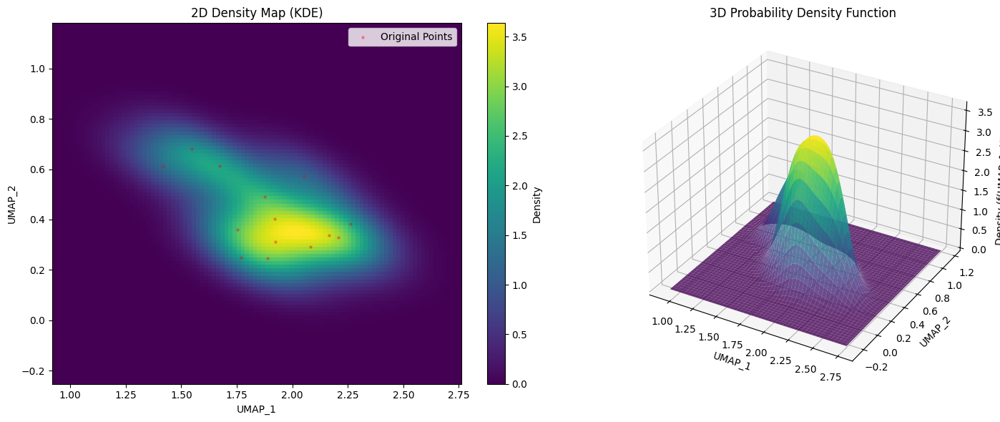

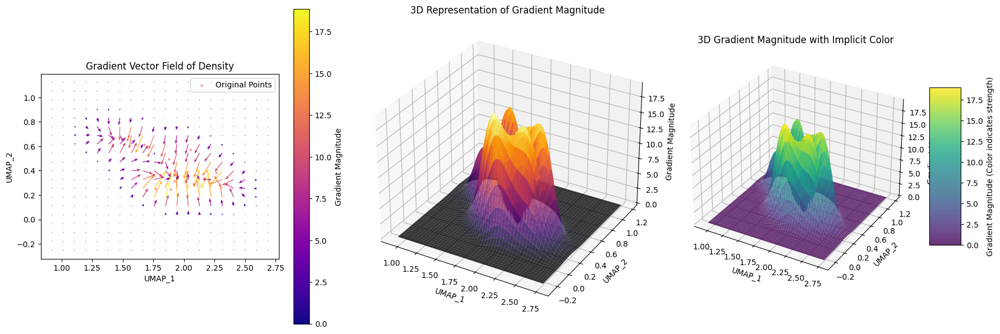

In [138]:
# --- 2. カーネル密度推定 (KDE) ---
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from mpl_toolkits.mplot3d import Axes3D # 3Dプロット用
import matplotlib.cm as cm # カラーマップ用
# データポイント (PC1とPC2)
UMAP_x = "UMAP_1"
UMAP_y = "UMAP_2"

x_data = umap_result_df[UMAP_x].values
y_data = umap_result_df[UMAP_y].values

# KDEオブジェクトの作成
# bw_method: 帯域幅の決定方法 ('scott', 'silverman' またはスカラー値)
# 'scott'や'silverman'はデータに基づいて自動で最適な帯域幅を推定します。
# 状況に応じて手動で調整することも可能です。例: bw_method=0.2
kde = gaussian_kde(np.vstack([x_data, y_data]))

# 評価するグリッド点の作成
# PC1とPC2の最小値から最大値までの範囲でグリッドを作成
x_min, x_max = x_data.min() - 0.5, x_data.max() + 0.5
y_min, y_max = y_data.min() - 0.5, y_data.max() + 0.5

# グリッドの解像度 (num_grid_pointsが大きいほど滑らかで計算量が増える)
num_grid_points = 100
X_grid, Y_grid = np.meshgrid(np.linspace(x_min, x_max, num_grid_points),
                             np.linspace(y_min, y_max, num_grid_points))

# 各グリッド点での密度を評価
Z_density = kde(np.vstack([X_grid.ravel(), Y_grid.ravel()])).reshape(X_grid.shape)

# --- 3. 確率密度関数の可視化 (Optional: ヒートマップと3D曲面) ---

plt.figure(figsize=(15, 6))

# ヒートマップ表示
plt.subplot(1, 2, 1)
plt.imshow(Z_density, origin='lower', extent=[x_min, x_max, y_min, y_max],
           cmap='viridis', aspect='auto')
plt.colorbar(label='Density')
plt.scatter(x_data, y_data, s=5, color='red', alpha=0.3, label='Original Points')
plt.title('2D Density Map (KDE)')
plt.xlabel(UMAP_x)
plt.ylabel(UMAP_y)
plt.legend()

# 3D曲面表示
ax = plt.subplot(1, 2, 2, projection='3d')
ax.plot_surface(X_grid, Y_grid, Z_density, cmap=cm.viridis, alpha=0.8)
ax.set_xlabel(UMAP_x)
ax.set_ylabel(UMAP_y)
ax.set_zlabel('Density (f(UMAP_1, UMAP_2))')
ax.set_title('3D Probability Density Function')

plt.tight_layout()
plt.show()

# --- 4. 勾配の計算 ---

# numpy.gradientを使用して数値的に勾配を計算
# Z_densityは(y, x)の形状と想定されるため、dxとdyをそれぞれグリッドのx方向とy方向のステップサイズで指定します。
# np.gradientは各軸に対して独立に差分を計算します。
# x方向のステップサイズ
dx = (x_max - x_min) / (num_grid_points - 1)
# y方向のステップサイズ
dy = (y_max - y_min) / (num_grid_points - 1)

# gy: y方向の勾配 (dZ/dy), gx: x方向の勾配 (dZ/dx)
gy, gx = np.gradient(Z_density, dy, dx)

# 勾配の大きさ (Magnitude)
gradient_magnitude = np.sqrt(gx**2 + gy**2)

# --- 5. 勾配の立体的な表現 ---

plt.figure(figsize=(18, 6))

# --- 5.1. ベクトル場として表示 (Quiver Plot) ---
plt.subplot(1, 3, 1)
# 勾配ベクトルが多すぎると見づらいので、一部を間引いて表示
stride = 5 # 例: 5点ごとに表示
plt.quiver(X_grid[::stride, ::stride], Y_grid[::stride, ::stride],
           gx[::stride, ::stride], gy[::stride, ::stride],
           gradient_magnitude[::stride, ::stride], cmap='plasma', scale=200, headwidth=4)
plt.colorbar(label='Gradient Magnitude')
plt.scatter(x_data, y_data, s=5, color='red', alpha=0.3, label='Original Points')
plt.title('Gradient Vector Field of Density')
plt.xlabel(UMAP_x)
plt.ylabel(UMAP_y)
plt.gca().set_aspect('equal', adjustable='box') # アスペクト比を等しくする
plt.legend()

# --- 5.2. 勾配の大きさを高さとして表示 (3D Surface Plot) ---
ax = plt.subplot(1, 3, 2, projection='3d')
ax.plot_surface(X_grid, Y_grid, gradient_magnitude, cmap=cm.inferno, alpha=0.8)
ax.set_xlabel(UMAP_x)
ax.set_ylabel(UMAP_y)
ax.set_zlabel('Gradient Magnitude')
ax.set_title('3D Representation of Gradient Magnitude')

# --- 5.3. 勾配の大きさを高さ、方向を色で表現 (3D Surface Plot with Hue) ---
# 勾配の方向 (アークタンジェント2)
gradient_direction = np.arctan2(gy, gx) # -pi から pi の範囲

ax = plt.subplot(1, 3, 3, projection='3d')

# 色を勾配の方向にマッピング
# Normalize the direction for color mapping (0 to 1)
norm_direction = (gradient_direction - gradient_direction.min()) / (gradient_direction.max() - gradient_direction.min())
colors = cm.hsv(norm_direction)

# Plot surface with facecolors for per-vertex coloring
# ここでは`plot_surface`ではなく`plot_trisurf`や手動で面の色を設定する方法も考えられますが、
# `plot_surface`で高さを勾配の大きさに、色を方向に対応させるのは少し工夫が必要です。
# 簡単にするために、ここでは勾配の大きさを高さ、色を単純なカラーマップで表示します。
# あるいは、方向の情報を色で表現するためには、`facecolors`引数を活用するか、
# より複雑なパッチベースのプロットが必要になります。
# 今回は、勾配の大きさを高さとし、色を別の情報（例：方向）にマッピングする一般的な例として、
# 単に勾配の大きさで色付けした上で、方向の情報を示唆するためにコメントアウトでヒントを残します。

# 簡単な方法: 勾配の大きさを高さ、勾配の大きさを色にそのまま使う (上記と同じだが、再度提示)
surf = ax.plot_surface(X_grid, Y_grid, gradient_magnitude, cmap=cm.viridis, alpha=0.8)
# 代わりに勾配の方向で色をつけたい場合は、`facecolors`引数を使うか、
# matplotlibのより低レベルなAPIを操作する必要があります。
# 例: `colors = cm.hsv((gradient_direction + np.pi) / (2 * np.pi))`
#    `surf = ax.plot_surface(X_grid, Y_grid, gradient_magnitude, facecolors=colors, shade=False)`
# しかし、`plot_surface`の`facecolors`はNumPyアレイを直接サポートしていないため、より複雑になります。
# この例では、勾配の大きさを高さにし、単純に色の濃淡で強さを示します。
# 勾配の方向の情報を色で表現したい場合は、例えば`streamplot`で流線を描いたり、
# 別途2Dプロットでカラーホイールを用いたベクトル場を示すのが一般的です。

ax.set_xlabel(UMAP_x)
ax.set_ylabel(UMAP_y)
ax.set_zlabel('Gradient Magnitude')
ax.set_title('3D Gradient Magnitude with Implicit Color')
plt.colorbar(surf, ax=ax, shrink=0.5, aspect=5, label='Gradient Magnitude (Color indicates strength)')


plt.tight_layout()
plt.show()

In [139]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from scipy.stats import gaussian_kde

# --- 2. カーネル密度推定 (KDE) ---
UMAP_x = "UMAP_1"
UMAP_y = "UMAP_2"

# データポイント (PC1とPC2)
x_data = umap_result_df[UMAP_x].values
y_data = umap_result_df[UMAP_y].values

# KDEオブジェクトの作成
kde = gaussian_kde(np.vstack([x_data, y_data]))

# 評価するグリッド点の作成
x_min, x_max = x_data.min() - 0.5, x_data.max() + 0.5
y_min, y_max = y_data.min() - 0.5, y_data.max() + 0.5

num_grid_points = 50 # 矢印の数を減らすため、グリッド点を少なめにする
X_grid, Y_grid = np.meshgrid(np.linspace(x_min, x_max, num_grid_points),
                             np.linspace(y_min, y_max, num_grid_points))

Z_density = kde(np.vstack([X_grid.ravel(), Y_grid.ravel()])).reshape(X_grid.shape)

# --- 3. 勾配の計算 ---

dx = (x_max - x_min) / (num_grid_points - 1)
dy = (y_max - y_min) / (num_grid_points - 1)

gy, gx = np.gradient(Z_density, dy, dx) # gy: dZ/dy, gx: dZ/dx
gradient_magnitude = np.sqrt(gx**2 + gy**2)

# 勾配の方向（ラジアン）
gradient_direction_rad = np.arctan2(gy, gx)

# --- 4. Plotly を使った可視化 (2D平面上の勾配ベクトル) ---

# グラフオブジェクトのリスト
data = []

# --- 4.1. 密度のヒートマップ (背景として) ---
# プロット点を表示しない代わりに、密度のヒートマップを背景として表示すると、
# 勾配が密度のどの領域に向かっているかが分かりやすくなります。
data.append(go.Heatmap(
    x=X_grid[0,:], # x軸のグリッド点
    y=Y_grid[:,0], # y軸のグリッド点
    z=Z_density,
    colorscale='Viridis', # 密度のカラーマップ
    name='Density Heatmap',
    colorbar_title='Density',
    showscale=True,
    opacity=0.8,
    zmin=Z_density.min(),
    zmax=Z_density.max()
))

# --- 4.2. 密度の等高線を追加 ---
# ここに go.Contour トレースを追加します。
data.append(go.Contour(
    x=X_grid[0,:],
    y=Y_grid[:,0],
    z=Z_density,
    showscale=False, # 等高線のカラーバーはヒートマップと重複するので非表示に
    contours=dict(
        coloring='lines', # 線のみで表示
        showlabels=True,  # ラベル（値）を表示
        labelfont=dict(size=10, color='white'), # ラベルのフォントスタイル
        # start, end, sizeで等高線の範囲と間隔を調整可能
        # 例: start=0.01, end=Z_density.max(), size=(Z_density.max()/10)
    ),
    line=dict(color='white', width=1), # 等高線の色と太さ
    name='Density Contours'
))


# --- 4.3. 勾配ベクトルを矢印で表現 ---
# 全てのグリッド点に矢印を描画すると重くなるため、間引いて表示
stride = 3 # 例: 3点ごとに矢印を表示 (num_grid_points=50の場合、約16x16=256本の矢印)

# Plotlyの角度は時計回り、0度が右。numpy.arctan2は反時計回り、0度が右。
# 変換: Plotly_angle = -np.degrees(numpy_angle)
plotly_angles = -np.degrees(gradient_direction_rad)

# 矢印プロット用のデータを平坦化
x_flat = X_grid[::stride, ::stride].flatten()
y_flat = Y_grid[::stride, ::stride].flatten()
angles_flat = plotly_angles[::stride, ::stride].flatten()
magnitude_flat = gradient_magnitude[::stride, ::stride].flatten() # 生の勾配の大きさ

# 勾配の大きさで色分け (青から赤)
data.append(go.Scatter(
    x=x_flat,
    y=y_flat,
    mode='markers',
    marker=dict(
        symbol='arrow', # 矢印シンボル
        size=8,         # 矢印のサイズ（固定）
        angle=angles_flat, # 矢印の向き (0度が右方向)
        color=magnitude_flat, # 勾配の大きさで色付け
        colorscale='Jet', # 青から赤へのグラデーションに適したカラーマップ (例: 'Jet', 'RdYlBu', 'Portland')
        colorbar=dict(title='Gradient Magnitude', x=1.15), # 右側にカラーバーを配置
        showscale=True,
        # 色の範囲を勾配の最小値から最大値に設定 (自動でも良いが明示的に)
        cmin=gradient_magnitude.min(),
        cmax=gradient_magnitude.max()
    ),
    name='Density Gradient Arrows'
))

# --- レイアウトの設定 ---
layout = go.Layout(
    title='2D Density Gradient Vector Field (Magnitude Colored)',
    xaxis=dict(title=f'{UMAP_x}', constrain='domain'),
    yaxis=dict(title=f'{UMAP_y}', scaleanchor='x', scaleratio=1), # アスペクト比を固定
    hovermode='closest',
    height=600,
    width=800
)

fig = go.Figure(data=data, layout=layout)
fig.show()

In [142]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from sklearn.cluster import MeanShift, estimate_bandwidth
import colorsys # 色変換のためにcolorsysをインポート

# Plotlyのレンダラー設定
pio.renderers.default = "notebook"

# --- 1. Mean Shiftクラスタリングの実行 ---

# UMAPの2次元データをクラスタリングの入力とする
X_meanshift = umap_result_df[['UMAP_1', 'UMAP_2']].values

# 最適なバンド幅を推定
# n_samplesパラメータを調整することで、バンド幅推定の計算負荷を軽減できます。
# 大規模なデータセットでは、部分的なデータで推定することも有効です。
# quantileは0.0から1.0の間の値で、近傍点の割合を決定します。
# デフォルトは0.3ですが、データをよく反映するように調整できます。
# random_stateは推定の再現性のため。
bandwidth = estimate_bandwidth(X_meanshift, quantile=0.25, n_samples=500, random_state=42) # quantileを調整してみる

print(f"推定されたバンド幅: {bandwidth:.2f}")

# MeanShiftモデルの初期化と学習
# bandwidth: クラスターのサイズを制御する最も重要なパラメータ
# seed: 再現性のために設定 (MeanShiftはランダム性を持つ場合がある)
ms_model = MeanShift(bandwidth=bandwidth, bin_seeding=True) # <-- random_stateを削除
ms_model.fit(X_meanshift)

# 各データ点のクラスターラベルを取得
umap_result_df['MeanShiftCluster'] = ms_model.labels_

# クラスターの重心（モード）を取得
cluster_centers = ms_model.cluster_centers_
num_clusters = len(cluster_centers)

print(f"Mean Shiftによって検出されたクラスター数: {num_clusters}")
print("\n各Mean Shiftクラスターのデータ点数:")
print(umap_result_df['MeanShiftCluster'].value_counts().sort_index())
print("-" * 50)


# --- 2. 各データ点と所属クラスター重心との距離を計算し、色分けを準備 ---

# 各データ点とその所属クラスター重心との距離を格納するリスト
distances_from_meanshift_centroid = []

for index, row in umap_result_df.iterrows():
    cluster_id = row['MeanShiftCluster']
    if cluster_id == -1: # ノイズ点 (-1) の場合、距離計算はスキップ
        distances_from_meanshift_centroid.append(np.nan)
        continue
    point_coords = np.array([row['UMAP_1'], row['UMAP_2']])
    centroid_coords = cluster_centers[cluster_id]
    distance = np.linalg.norm(point_coords - centroid_coords)
    distances_from_meanshift_centroid.append(distance)

umap_result_df['DistanceToMeanShiftCentroid'] = distances_from_meanshift_centroid

# 距離に基づく色のカテゴリ作成 (UMAPの結果プロットで使ったロジックを再利用)
# ノイズ点 (-1) は別途扱うか、除外します。ここでは含めず色分け。
OUTLIER_THRESHOLD = 3.00 # この閾値は引き続き使用。データによって調整。

# ノイズ点を除いたデータでカテゴリを生成
def create_distance_category(row, threshold):
    cluster_id = row['MeanShiftCluster']
    distance = row['DistanceToMeanShiftCentroid']
    if cluster_id == -1:
        return 'Noise (-1)' # ノイズ点は特別なカテゴリとする
    elif distance >= threshold:
        return f'Cluster {int(cluster_id)} (>={threshold})'
    else:
        return f'Cluster {int(cluster_id)} (<{threshold})'

umap_result_df['DistanceCategoryMeanShift'] = umap_result_df.apply(
    lambda row: create_distance_category(row, OUTLIER_THRESHOLD), axis=1
)


# Plotlyのデフォルトカラーパレットの基本色を取得
# ノイズ点 (-1) のための色も考慮に入れる
base_colors_raw = px.colors.qualitative.Plotly[:num_clusters] # 検出されたクラスター数に合わせて色を準備

color_map = {}
darkening_factor = 0.7

def hex_to_rgb(hex_color):
    hex_color = hex_color.lstrip('#')
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

for i, base_color_val in enumerate(base_colors_raw):
    r, g, b = 0, 0, 0
    if base_color_val.startswith('rgb('):
        rgb_values = [int(c) for c in base_color_val.replace('rgb(', '').replace(')', '').split(',')]
        r, g, b = [c / 255.0 for c in rgb_values]
    elif base_color_val.startswith('#'):
        r_int, g_int, b_int = hex_to_rgb(base_color_val)
        r, g, b = [r_int / 255.0, g_int / 255.0, b_int / 255.0]
    else:
        print(f"警告: 未知のカラー形式 '{base_color_val}' が見つかりました。スキップします。")
        continue

    h, s, v = colorsys.rgb_to_hsv(r, g, b)
    v_dark = v * darkening_factor
    if v_dark < 0: v_dark = 0
    r_dark, g_dark, b_dark = [int(c * 255) for c in colorsys.hsv_to_rgb(h, s, v_dark)]
    dark_color_str = f'rgb({r_dark},{g_dark},{b_dark})'
    base_color_str = f'rgb({int(r*255)},{int(g*255)},{int(b*255)})'

    color_map[f'Cluster {i} (<{OUTLIER_THRESHOLD})'] = base_color_str
    color_map[f'Cluster {i} (>={OUTLIER_THRESHOLD})'] = dark_color_str

# ノイズ点の色を追加（グレーなど）
if 'Noise (-1)' in umap_result_df['DistanceCategoryMeanShift'].unique():
    color_map['Noise (-1)'] = 'rgb(128, 128, 128)' # グレー


# --- 3. 結果のプロット (Plotly Express) ---

fig = px.scatter(umap_result_df,
                 x='UMAP_1',
                 y='UMAP_2',
                 color='DistanceCategoryMeanShift', # Mean Shiftの結果で色分け
                 color_discrete_map=color_map, # カスタムカラーマップを適用
                 hover_data={'date': True, 'MeanShiftCluster': True, 'DistanceToMeanShiftCentroid': ':.2f'},
                 title=f'UMAP Projection with Mean Shift Clusters (Bandwidth: {bandwidth:.2f})',
                 labels={'UMAP_1': 'UMAP Component 1', 'UMAP_2': 'UMAP Component 2', 'color': 'Cluster & Distance'},
                 height=700,
                 width=800
                )

# Mean Shiftのクラスター重心を追加でプロット
cluster_centers_df = pd.DataFrame(cluster_centers, columns=['UMAP_1', 'UMAP_2'])
cluster_centers_df['Cluster'] = [f'Centroid {i}' for i in range(num_clusters)]

fig.add_scatter(x=cluster_centers_df['UMAP_1'], y=cluster_centers_df['UMAP_2'],
                mode='markers',
                marker=dict(size=12, color='black', symbol='star', line=dict(width=2, color='white')),
                name='Mean Shift Centroids',
                hoverinfo='text',
                hovertext=cluster_centers_df['Cluster']
               )

fig.update_layout(
    xaxis_title='UMAP Component 1',
    yaxis_title='UMAP Component 2',
    hovermode='closest',
    font=dict(
        family="Yu Gothic, Meiryo, sans-serif",
        size=12
    )
)

fig.show()

print("\n--- Mean Shiftクラスタリングの解釈 ---")
print("Mean Shiftは、データ点の密度が高い場所（山の頂点）に収束することでクラスターを形成します。")
print("  - プロット上の**黒い星マーク**が、Mean Shiftによって検出されたクラスターの重心（密度のピーク）です。")
print("  - 各クラスターの点は、その重心に向かって勾配を辿って収束した点と考えることができます。")
print("  - K-meansとは異なり、クラスターの形状が球状に限定されず、より自然な（密度の）塊を検出できます。")
print("  - **クラスター数もデータから自動的に決定されます** (`num_clusters` の値を確認)。")
print("  - `DistanceCategoryMeanShift` で色分けされた濃淡は、各点が所属クラスターの重心からどれだけ離れているかを示しています。濃い色は、クラスターの端にあるか、そのクラスター内での外れ値的な点を示唆します。")
print("  - **ノイズ点 (-1)** が存在する場合、これらはどのクラスターにも属さない点としてグレーで表示されます。")
print("\n--- バンド幅の調整について ---")
print(f"現在の推定バンド幅は {bandwidth:.2f} です。")
print("もしクラスター数が多すぎたり少なすぎたりする場合、`estimate_bandwidth` の `quantile` パラメータを調整するか、")
print("MeanShiftモデルの `bandwidth` を手動で直接指定してみてください。")
print("  - `bandwidth` を小さくすると、より多くの小さなクラスターが検出されやすくなります。")
print("  - `bandwidth` を大きくすると、より少ない大きなクラスターが検出されやすくなります。")
print("あなたの「山の麓までの範囲」という概念は、このバンド幅の調整によってある程度制御できると考えることができます。")

推定されたバンド幅: 0.15
Mean Shiftによって検出されたクラスター数: 4

各Mean Shiftクラスターのデータ点数:
MeanShiftCluster
0    6
1    4
2    3
3    1
Name: count, dtype: int64
--------------------------------------------------



--- Mean Shiftクラスタリングの解釈 ---
Mean Shiftは、データ点の密度が高い場所（山の頂点）に収束することでクラスターを形成します。
  - プロット上の**黒い星マーク**が、Mean Shiftによって検出されたクラスターの重心（密度のピーク）です。
  - 各クラスターの点は、その重心に向かって勾配を辿って収束した点と考えることができます。
  - K-meansとは異なり、クラスターの形状が球状に限定されず、より自然な（密度の）塊を検出できます。
  - **クラスター数もデータから自動的に決定されます** (`num_clusters` の値を確認)。
  - `DistanceCategoryMeanShift` で色分けされた濃淡は、各点が所属クラスターの重心からどれだけ離れているかを示しています。濃い色は、クラスターの端にあるか、そのクラスター内での外れ値的な点を示唆します。
  - **ノイズ点 (-1)** が存在する場合、これらはどのクラスターにも属さない点としてグレーで表示されます。

--- バンド幅の調整について ---
現在の推定バンド幅は 0.15 です。
もしクラスター数が多すぎたり少なすぎたりする場合、`estimate_bandwidth` の `quantile` パラメータを調整するか、
MeanShiftモデルの `bandwidth` を手動で直接指定してみてください。
  - `bandwidth` を小さくすると、より多くの小さなクラスターが検出されやすくなります。
  - `bandwidth` を大きくすると、より少ない大きなクラスターが検出されやすくなります。
あなたの「山の麓までの範囲」という概念は、このバンド幅の調整によってある程度制御できると考えることができます。


In [15]:
umap_result_df["降雪量合計(cm)"] = df["降雪量合計(cm)"]
umap_result_df

,UMAP_1,UMAP_2,date,降雪量合計(cm)
0,1.235051,4.061361,1961-12-01,0
1,-1.341908,1.307321,1962-01-01,0
2,-1.323072,1.860021,1962-02-01,0
3,2.859021,5.251019,1962-03-01,0
4,3.014899,4.190057,1962-12-01,0
...,...,...,...,...
247,6.536445,5.600537,2023-03-01,0
248,3.441808,6.794331,2023-12-01,0
249,0.682259,4.251031,2024-01-01,0
250,4.988526,4.443418,2024-02-01,9


In [ ]:
UMAP1{1<x<2.5}
UMAP2{0.2<y<1}

In [22]:
import plotly.graph_objects as go
import numpy as np

# X軸とY軸のデータをランダムに生成（例: 観測地点の座標）
x_data = umap_result_df["UMAP_1"]
y_data = umap_result_df["UMAP_2"]


z_data = df["降雪量合計(cm)"]

# 2. 3D散布図の作成
fig = go.Figure(data=[go.Scatter3d(
    x=x_data,
    y=y_data,
    z=z_data,
    mode='markers',
    marker=dict(
        size=2,
        color=z_data,                # マーカーの色をZ軸の値（降雪量）に応じて変化させる
        colorscale='Blues',        # カラースケールを設定
        colorbar=dict(
            title='降雪量合計(cm)'      # カラーバーのタイトル
        ),
        opacity=0.8
    ),
     # ↓↓↓ ホバーテキストに表示する情報を設定 ↓↓↓
    text=df['date'].dt.strftime('%Y-%m-%d'), # 各点の日付情報をテキストとして渡す
    hovertemplate=(
        "<b>日付: %{text}</b><br><br>" +
        "X座標: %{x:.2f}<br>" +
        "Y座標: %{y:.2f}<br>" +
        "降雪量: %{z:.2f} cm" +
        "<extra></extra>" # 右側に表示される余分なトレース情報を非表示にする
    )
    # ↑↑↑ ホバーテキストの設定ここまで ↑↑↑
)])

# 3. グラフのレイアウト設定
fig.update_layout(
    template='plotly_dark',
    title='観測地点ごとの降雪量合計',
    scene=dict(
        xaxis_title='UMAP1',
        yaxis_title='UMAP2',
        zaxis_title='降雪量合計 (cm)'
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

# 4. グラフの表示
fig.show()

In [130]:
umap_result_df["降雪量合計(cm)"] = df["降雪量合計(cm)"]
umap_result_df

,UMAP_1,UMAP_2,date,降雪量合計(cm)
22,2.052956,0.572180,1967-02-01,24
26,1.889477,0.247357,1968-02-01,30
31,2.165387,0.336470,1969-03-01,54
37,1.418438,0.614317,1971-01-01,15
54,1.673640,0.613503,1975-02-01,15
65,1.876358,0.491364,1978-01-01,24
89,2.081390,0.291070,1984-01-01,57
90,1.925204,0.312889,1984-02-01,31
98,1.753467,0.361601,1986-02-01,26
130,1.769178,0.249987,1994-02-01,27


In [133]:

# 1. データを2つのグループに分割
df_snow = umap_result_df[umap_result_df['降雪量合計(cm)'] > 0]
df_no_snow = umap_result_df[umap_result_df['降雪量合計(cm)'] == 0]

bright_colorscale = [
    [0.0, "white"],  # 最小値の色: 明るい赤
    #[0.5, "white"],    # 中間値の色: 白
    [1.0, "#619CFF"]   # 最大値の色: 明るい青
]

# 2. まず「降雪量 > 0」のデータで基本のグラフを作成
fig = px.scatter(
    df_snow, # 降雪量があるデータのみ使用
    x='UMAP_1',
    y='UMAP_2',
    color='降雪量合計(cm)',
    color_continuous_scale=bright_colorscale, # または 'coolwarm_r'
    hover_data={
        'date': True,
        'UMAP_1': ':.2f',
        'UMAP_2': ':.2f',
        '降雪量合計(cm)': ':.2f'
    },
    labels={
        'UMAP_1': 'UMAP Component 1',
        'UMAP_2': 'UMAP Component 2',
        '降雪量合計(cm)': '降雪量 (cm)'
    },
    title='UMAP Projection (降雪量ゼロの点を黒で表示)',
    height=700,
    width=800
)

# 3. 次に「降雪量 == 0」のデータを黒い点としてグラフに追加
# 降雪量0のデータが存在する場合のみ追加
if not df_no_snow.empty:
    fig.add_trace(go.Scatter(
        x=df_no_snow['UMAP_1'],
        y=df_no_snow['UMAP_2'],
        mode='markers',
        marker=dict(
            color='black',
            size=4,
            line=dict(width=1, color='white') # ダークテーマ上で見やすくするために白い枠線を追加
        ),
        # こちらのホバー情報も設定
        customdata=df_no_snow[['date', '降雪量合計(cm)']],
        hovertemplate=(
            "<b>date</b>: %{customdata[0]|%Y-%m-%d}<br>" +
            "<b>UMAP_1</b>: %{x:.2f}<br>" +
            "<b>UMAP_2</b>: %{y:.2f}<br>" +
            "<b>降雪量合計(cm)</b>: %{customdata[1]:.2f}" +
            "<extra></extra>" # 右側の余分な情報を非表示
        ),
        showlegend=True
    ))

# 4. 全体のレイアウトを更新
fig.update_layout(
    template='plotly_dark',
    xaxis_title='UMAP Component 1',
    yaxis_title='UMAP Component 2',
    hovermode='closest',
    font=dict(
        family="Yu Gothic, Meiryo, sans-serif",
        size=12
    ),
)

fig.show()

In [153]:
df[umap_result_df["MeanShiftCluster"]==0]

,date,平均気温(℃),最低気温(℃),降水量の合計(mm),平均蒸気圧(hPa),平均湿度(％),日照時間(時間),降雪量合計(cm),大雪ダミー,降雪ダミー,year,month
26,1968-02-01,4.3,-2.9,48.0,3.7,44,205.8,30,1,1,1968,2
65,1978-01-01,5.6,-1.6,28.0,4.6,50,160.0,24,1,1,1978,1
90,1984-02-01,3.0,-3.5,51.0,4.0,52,182.5,31,1,1,1984,2
98,1986-02-01,4.3,-1.6,27.5,4.1,49,181.6,26,1,1,1986,2
130,1994-02-01,6.6,-2.3,88.5,4.4,45,206.2,27,1,1,1994,2
225,2018-01-01,4.7,-4.0,48.5,4.6,54,206.1,23,1,1,2018,1


In [154]:
df[umap_result_df["MeanShiftCluster"]==1]

,date,平均気温(℃),最低気温(℃),降水量の合計(mm),平均蒸気圧(hPa),平均湿度(％),日照時間(時間),降雪量合計(cm),大雪ダミー,降雪ダミー,year,month
31,1969-03-01,7.9,-1.5,121.0,6.4,58,179.3,54,1,1,1969,3
89,1984-01-01,3.7,-2.5,50.0,4.0,51,208.8,57,1,1,1984,1
145,1998-01-01,5.3,-0.8,122.0,5.2,59,162.5,32,1,1,1998,1
210,2014-02-01,5.9,-0.9,157.5,5.0,52,139.8,49,1,1,2014,2


In [61]:
pca_df

,PC1,PC2,PC3
0,-0.263076,-0.100867,-0.482403
1,-2.475518,0.370285,-0.827467
2,-2.166848,-0.305524,-0.650041
3,0.666230,-0.175449,-0.250219
4,0.797823,0.410490,-0.711859
...,...,...,...
247,5.952337,-0.619180,0.759625
248,1.135395,-0.992052,-0.030430
249,-0.588645,-0.441075,-0.314680
250,1.702302,1.311758,0.053430


In [65]:
pca_df["降雪量合計(cm)"] = df["降雪量合計(cm)"]
pca_df["date"] = df["date"]
pca_df

,PC1,PC2,PC3,降雪量合計(cm),date
0,-0.263076,-0.100867,-0.482403,0,1961-12-01
1,-2.475518,0.370285,-0.827467,0,1962-01-01
2,-2.166848,-0.305524,-0.650041,0,1962-02-01
3,0.666230,-0.175449,-0.250219,0,1962-03-01
4,0.797823,0.410490,-0.711859,0,1962-12-01
...,...,...,...,...,...
247,5.952337,-0.619180,0.759625,0,2023-03-01
248,1.135395,-0.992052,-0.030430,0,2023-12-01
249,-0.588645,-0.441075,-0.314680,0,2024-01-01
250,1.702302,1.311758,0.053430,9,2024-02-01


In [21]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

# --- サンプルデータの作成 ---
# (前回と同様のコードなので変更ありません)

# 1. データを2つのグループに分割
df_snow = pca_df[pca_df['降雪量合計(cm)'] > 0]
df_no_snow = pca_df[pca_df['降雪量合計(cm)'] == 0]

# 明るい赤・白・青のカスタムカラースケールを定義
bright_colorscale = [
    [0.0, "#F8766D"],  # 最小値の色: 明るい赤
    [0.5, "white"],    # 中間値の色: 白
    [1.0, "#619CFF"]   # 最大値の色: 明るい青
]


# 2. go.Figureを使ってグラフの器を初期化
fig = go.Figure()

# 3. 「降雪量 > 0」のデータを最初のトレースとして追加
fig.add_trace(go.Scatter3d(
    x=df_snow['PC1'],
    y=df_snow['PC2'],
    z=df_snow['PC3'],
    mode='markers',
    # --- ↓↓↓ ここからがサイズ調整のポイント ↓↓↓ ---
    marker=dict(
        # 【方法1】降雪量に応じてサイズを変更
        #size=df_snow['降雪量合計(cm)'],  # サイズの基準となるデータを指定
        #sizemin=3,                   # 最小の点のサイズを保証
        #sizemode='diameter',         # サイズの計算方法
        #sizeref=df_snow['降雪量合計(cm)'].max() / 15, # この値で全体のスケールを調整（大きいほど点は小さくなる）

        # 【方法2】均一なサイズにしたい場合は、上の4行をコメントアウトして下の1行を有効にする
        size=2,

        color=df_snow['降雪量合計(cm)'], # 色の基準
        colorscale=bright_colorscale,      # カラースケール
        colorbar=dict(title='降雪量 (cm)'), # カラーバーの設定
        showscale=True,                    # カラーバーを表示
    ),
    # --- ↑↑↑ ここまでがサイズ調整のポイント ↑↑↑ ---
    customdata=df_snow[['date', 'PC1', 'PC2', 'PC3', '降雪量合計(cm)']],
    hovertemplate=(
        "<b>date</b>: %{customdata[0]|%Y-%m-%d}<br>" +
        "<b>PC1</b>: %{customdata[1]:.2f}<br>" +
        "<b>PC2</b>: %{customdata[2]:.2f}<br>" +
        "<b>PC3</b>: %{customdata[3]:.2f}<br>" +
        "<b>降雪量合計(cm)</b>: %{customdata[4]:.2f}" +
        "<extra></extra>"
    ),
))

# 4. 「降雪量 == 0」のデータを2番目のトレースとして追加
if not df_no_snow.empty:
    fig.add_trace(go.Scatter3d(
        x=df_no_snow['PC1'],
        y=df_no_snow['PC2'],
        z=df_no_snow['PC3'],
        mode='markers',
        marker=dict(
            color='black',
            size=2, # こちらのサイズは固定
            line=dict(width=1, color='white')
        ),
        customdata=df_no_snow[['date', 'PC1', 'PC2', 'PC3', '降雪量合計(cm)']],
        hovertemplate=(
            "<b>date</b>: %{customdata[0]|%Y-%m-%d}<br>" +
            "<b>PC1</b>: %{customdata[1]:.2f}<br>" +
            "<b>PC2</b>: %{customdata[2]:.2f}<br>" +
            "<b>PC3</b>: %{customdata[3]:.2f}<br>" +
            "<b>降雪量合計(cm)</b>: %{customdata[4]:.2f}" +
            "<extra></extra>"
        ),
    ))

# 5. 全体のレイアウトを更新
fig.update_layout(
    title='3D PCA Projection (点のサイズを降雪量で調整)',
    template='plotly_dark',
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    ),
    hovermode='closest',
    font=dict(
        family="Yu Gothic, Meiryo, sans-serif",
        size=12
    ),
    height=800,
    width=900
)

fig.show()

In [21]:
import math
PC_num = "PC3"
pca_df1 = pca_df.select_dtypes(include=['number'])
ment_num = 3

description = numeric_df[pca_df1[f'{PC_num}'] >= ment_num].describe()
mean_median = description.loc[['mean', '50%','std']]

count = numeric_df[pca_df1[f'{PC_num}'] >= ment_num].count()
skewness = numeric_df[pca_df1[f'{PC_num}'] >= ment_num].skew()
kurtess = numeric_df[pca_df1[f'{PC_num}'] >= ment_num].kurt()

# 歪度の結果をデータフレームに変換し、行名を設定
count_df = pd.DataFrame([count], index=['count'])
skewness_df = pd.DataFrame([skewness], index=['skew'])
kurt_df = pd.DataFrame([kurtess], index=['kurt'])

# desc_stats に skewness_df を結合
# axis=0 で行方向に結合します
full_stats = pd.concat([mean_median,count_df, skewness_df,kurt_df])
full_stats

,平均気温(℃),最低気温(℃),降水量の合計(mm),平均蒸気圧(hPa),平均湿度(％),日照時間(時間),降雪量合計(cm)
mean,-0.808061,-0.708762,0.865557,-0.375041,0.145109,-0.074616,6.468537
50%,-0.772973,-0.633328,1.107532,-0.488978,-0.131917,0.042254,6.553857
std,1.105679,0.457292,1.150220,1.030165,0.629283,1.213836,0.517222
count,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
skew,-0.142659,-0.722109,-0.904780,0.491613,1.597097,-0.429252,-0.722109
kurt,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
import math
UMAP_num = "UMAP_2"
umap_number_df = umap_result_df.select_dtypes(include=['number'])
ment_num = 0.6

description = numeric_df[umap_result_df[f'{UMAP_num}'] < ment_num].describe()
mean_median = description.loc[['mean', '50%','std']]

count = numeric_df[umap_result_df[f'{UMAP_num}'] < ment_num].count()
skewness = numeric_df[umap_result_df[f'{UMAP_num}'] < ment_num].skew()
kurtess = numeric_df[umap_result_df[f'{UMAP_num}'] < ment_num].kurt()

# 歪度の結果をデータフレームに変換し、行名を設定
count_df = pd.DataFrame([count], index=['count'])
skewness_df = pd.DataFrame([skewness], index=['skew'])
kurt_df = pd.DataFrame([kurtess], index=['kurt'])

# desc_stats に skewness_df を結合
# axis=0 で行方向に結合します
full_stats = pd.concat([mean_median,count_df, skewness_df,kurt_df])
full_stats

,平均気温(℃),最低気温(℃),降水量の合計(mm),平均蒸気圧(hPa),平均湿度(％),日照時間(時間),降雪量合計(cm)
mean,-1.189241,-1.101359,0.064649,-0.791945,-0.147028,0.115245,4.029176
50%,-1.299288,-1.085929,-0.386400,-0.830787,-0.131917,0.122895,3.482355
std,0.722972,0.655926,0.923057,0.651194,0.815829,0.820466,1.626989
count,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000
skew,0.582660,-0.263591,0.958774,1.146164,-0.137773,-0.281144,1.066849
kurt,0.502585,-1.297556,-0.387115,1.741474,-0.732132,-1.034307,-0.575367


In [24]:
umap_result_df[df["降雪量合計(cm)"] >= 15]

,UMAP_1,UMAP_2,date,降雪量合計(cm)
22,2.052956,0.572180,1967-02-01,24
26,1.889477,0.247357,1968-02-01,30
31,2.165387,0.336470,1969-03-01,54
37,1.418438,0.614317,1971-01-01,15
54,1.673640,0.613503,1975-02-01,15
65,1.876358,0.491364,1978-01-01,24
89,2.081390,0.291070,1984-01-01,57
90,1.925204,0.312889,1984-02-01,31
98,1.753467,0.361601,1986-02-01,26
130,1.769178,0.249987,1994-02-01,27


In [17]:
umap_result_df

,UMAP_1,UMAP_2,date,降雪量合計(cm)
0,1.235051,4.061361,1961-12-01,0
1,-1.341908,1.307321,1962-01-01,0
2,-1.323072,1.860021,1962-02-01,0
3,2.859021,5.251019,1962-03-01,0
4,3.014899,4.190057,1962-12-01,0
...,...,...,...,...
247,6.536445,5.600537,2023-03-01,0
248,3.441808,6.794331,2023-12-01,0
249,0.682259,4.251031,2024-01-01,0
250,4.988526,4.443418,2024-02-01,9


In [72]:
PC_num = "PC1"
df[pca_df1[f'{PC_num}'] >= 3]

,date,平均気温(℃),最低気温(℃),降水量の合計(mm),平均蒸気圧(hPa),平均湿度(％),日照時間(時間),降雪量合計(cm),大雪ダミー,降雪ダミー,year,month
28,1968-12-01,10.2,1.1,188.0,7.6,59,137.2,0,0,0,1968,12
95,1985-03-01,7.8,1.3,134.5,7.6,72,74.0,0,0,0,1985,3
114,1990-02-01,7.8,0.1,116.5,7.2,67,81.6,11,0,1,1990,2
119,1991-03-01,9.5,1.6,164.0,7.6,63,115.8,0,0,0,1991,3
123,1992-03-01,9.7,1.7,205.0,8.0,66,98.8,0,0,0,1992,3
135,1995-03-01,8.9,1.0,180.0,7.2,63,134.4,2,0,1,1995,3
151,1999-03-01,10.1,2.1,144.5,8.0,62,119.0,0,0,0,1999,3
180,2006-12-01,9.5,3.7,200.5,6.2,52,141.4,0,0,0,2006,12
227,2018-03-01,11.5,1.7,220.0,8.9,65,198.0,0,0,0,2018,3
232,2019-12-01,8.5,2.2,76.5,7.3,66,128.6,0,0,0,2019,12


In [ ]:
パターン1:"平均気温,最低気温が通常より低く、気圧がが若干低い→「大雪の可能性あり」"
パターン2:"平均気温,最低気温が通常より低く、気圧がが若干低い。加えて降水と湿度が通常より高く、日照時間が短い→「降雪の可能あり」"

In [53]:
pca_df1

,PC1,PC2,PC3,降雪量合計(cm)
0,-0.263076,-0.100867,-0.482403,0
1,-2.475518,0.370285,-0.827467,0
2,-2.166848,-0.305524,-0.650041,0
3,0.666230,-0.175449,-0.250219,0
4,0.797823,0.410490,-0.711859,0
...,...,...,...,...
247,5.952337,-0.619180,0.759625,0
248,1.135395,-0.992052,-0.030430,0
249,-0.588645,-0.441075,-0.314680,0
250,1.702302,1.311758,0.053430,9


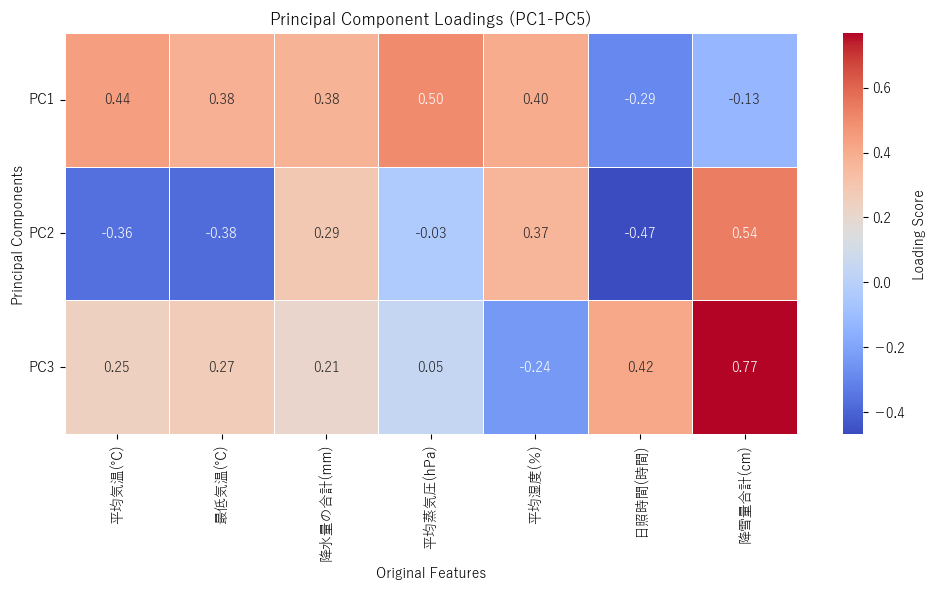


--- 主成分負荷量の解釈方法 ---
主成分負荷量（上記の表またはヒートマップ）を見て、以下の点を把握します。
1. **絶対値が大きいほど、その特徴量がその主成分に強く影響している**ことを示します。
2. **正の値**: その特徴量の値が増加すると、その主成分の値も増加する傾向にあります。
3. **負の値**: その特徴量の値が増加すると、その主成分の値は減少する傾向にあります（逆相関）。
例：
  - もしPC1の負荷量が「攻撃力」で0.8（高い正の値）、「防御力」で0.1（低い値）だった場合、
    PC1は主に「攻撃力」と関連が強い軸であると解釈できます。
  - もしPC2の負荷量が「HP」で0.7、「回避値」で-0.6だった場合、
    PC2は「HPが高いほど値が高く、回避値が高いほど値が低くなる」軸であると解釈できます。
このようにして、各主成分が元の特徴量のどのような側面を捉えているかを理解し、UMAP空間の解釈に役立てることができます。


In [144]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

mpl.rcParams['font.family'] = 'Yu Gothic'

# --- PCAの実行 ---
original_features = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)','降雪量合計(cm)']
# 累積寄与率80%まで、または次元数を指定してPCAを実行します。
# 以前の会話で「5次元のPCA」とありましたので、ここではn_components=5で実行します。
n_components_to_keep = 3 # 第5主成分まで確認するため

pca = PCA(n_components=n_components_to_keep)
pca.fit(numeric_df)

# PCAで削減されたデータ（pca_df）の作成
pca_df = pd.DataFrame(pca.transform(numeric_df),
                      columns=[f'PC{i+1}' for i in range(n_components_to_keep)])

# --- 主成分負荷量の確認 ---

# pca.components_ は (n_components, n_features) の形状をしています。
# 各行が主成分、各列が元の特徴量に対応します。
loadings = pca.components_

# 主成分負荷量をDataFrameに変換して見やすくする
loadings_df = pd.DataFrame(loadings,
                           columns=original_features, # 列名に元の特徴量
                           index=[f'PC{i+1}' for i in range(n_components_to_keep)]) # 行名に主成分名

# 可視化してより分かりやすくする (ヒートマップ)
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(loadings_df, cmap='coolwarm', annot=True, fmt=".2f", linewidths=.5, cbar_kws={"label": "Loading Score"})
plt.title('Principal Component Loadings (PC1-PC5)')
plt.xlabel('Original Features')
plt.ylabel('Principal Components')
plt.yticks(rotation=0) # Y軸のラベルを水平に
plt.tight_layout()
plt.show()

print("\n--- 主成分負荷量の解釈方法 ---")
print("主成分負荷量（上記の表またはヒートマップ）を見て、以下の点を把握します。")
print("1. **絶対値が大きいほど、その特徴量がその主成分に強く影響している**ことを示します。")
print("2. **正の値**: その特徴量の値が増加すると、その主成分の値も増加する傾向にあります。")
print("3. **負の値**: その特徴量の値が増加すると、その主成分の値は減少する傾向にあります（逆相関）。")
print("例：")
print("  - もしPC1の負荷量が「攻撃力」で0.8（高い正の値）、「防御力」で0.1（低い値）だった場合、")
print("    PC1は主に「攻撃力」と関連が強い軸であると解釈できます。")
print("  - もしPC2の負荷量が「HP」で0.7、「回避値」で-0.6だった場合、")
print("    PC2は「HPが高いほど値が高く、回避値が高いほど値が低くなる」軸であると解釈できます。")
print("このようにして、各主成分が元の特徴量のどのような側面を捉えているかを理解し、UMAP空間の解釈に役立てることができます。")

目的変数のクラス比率:
大雪ダミー
0    238
1     14
Name: count, dtype: int64
------------------------------
訓練データのサンプル数: 176
テストデータのサンプル数: 76
------------------------------
AdaBoost分類モデルの学習を開始します...
学習が完了しました。
------------------------------
モデルの性能評価:
正解率 (Accuracy): 0.947
------------------------------
分類レポート:
              precision    recall  f1-score   support

  大雪ではない (0)       0.96      0.99      0.97        72
      大雪 (1)       0.50      0.25      0.33         4

    accuracy                           0.95        76
   macro avg       0.73      0.62      0.65        76
weighted avg       0.94      0.95      0.94        76

------------------------------


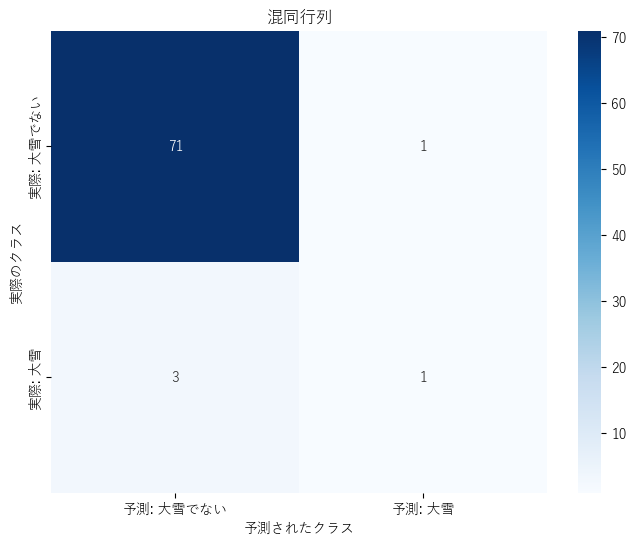

特徴量の重要度:
      Feature  Importance
5    日照時間(時間)    0.321413
2  降水量の合計(mm)    0.251302
0     平均気温(℃)    0.144605
3  平均蒸気圧(hPa)    0.108994
1     最低気温(℃)    0.090082
4     平均湿度(％)    0.083604


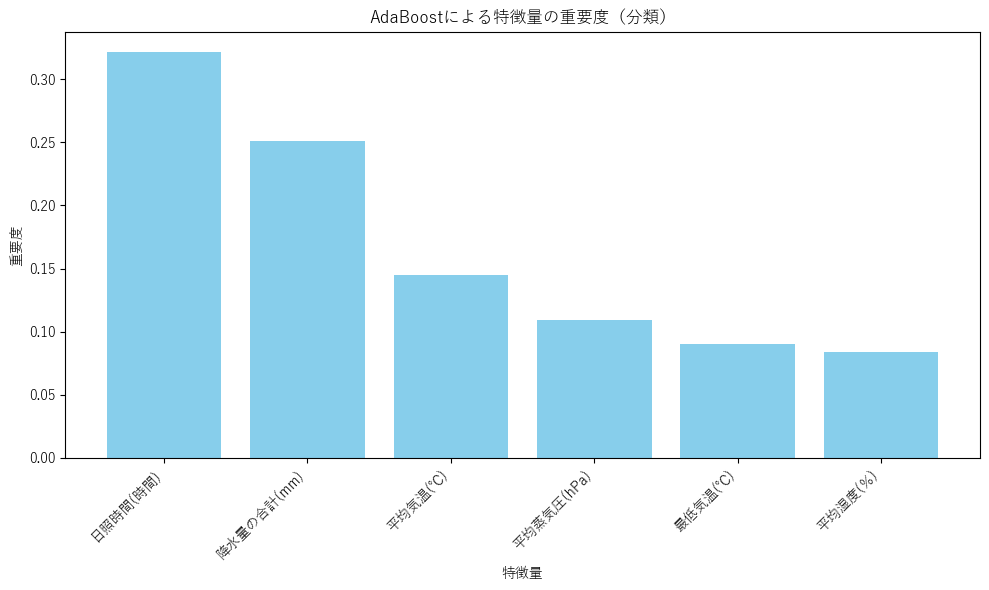

In [77]:
#AdaBoost
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# --- 2. 説明変数と目的変数の定義 ---
X = numeric_df[['平均気温(℃)', '最低気温(℃)', '降水量の合計(mm)', '平均蒸気圧(hPa)', '平均湿度(％)', '日照時間(時間)']]
y = df['大雪ダミー'] # 目的変数を「大雪ダミー」に設定

# 目的変数のクラスの比率を確認
print("目的変数のクラス比率:")
print(y.value_counts())
print("-" * 30)

# --- 3. 訓練データとテストデータへの分割 ---
# stratify=y を指定し、訓練・テストデータで目的変数の比率を維持する
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

print(f"訓練データのサンプル数: {len(X_train)}")
print(f"テストデータのサンプル数: {len(X_test)}")
print("-" * 30)


# --- 4. AdaBoostモデルの構築と学習 ---
# AdaBoost分類モデルを初期化
# 弱い学習器として、深さ1の決定木（決定株: Decision Stump）を使用することが多い
base_estimator = DecisionTreeClassifier(max_depth=1)

ada_model_clf = AdaBoostClassifier(
    estimator=base_estimator,
    n_estimators=100,      # 決定木の数
    learning_rate=1.0,     # 学習率
    random_state=42
)

# モデルを学習させる
print("AdaBoost分類モデルの学習を開始します...")
ada_model_clf.fit(X_train, y_train)
print("学習が完了しました。")
print("-" * 30)


# --- 5. テストデータによる予測と評価 ---
# テストデータを使って予測を実行
y_pred = ada_model_clf.predict(X_test)

# モデルの性能を評価
print("モデルの性能評価:")
print(f"正解率 (Accuracy): {accuracy_score(y_test, y_pred):.3f}")
print("-" * 30)

# 分類レポート（適合率、再現率、F1スコアをまとめて表示）
print("分類レポート:")
print(classification_report(y_test, y_pred, target_names=['大雪ではない (0)', '大雪 (1)']))
print("-" * 30)

# 混同行列を作成
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['予測: 大雪でない', '予測: 大雪'],
            yticklabels=['実際: 大雪でない', '実際: 大雪'])
plt.title('混同行列')
plt.ylabel('実際のクラス')
plt.xlabel('予測されたクラス')
plt.show()


# --- 6. 結果の可視化と解釈 ---
# どの特徴量が重要だったかを確認（特徴量の重要度）
feature_importances = ada_model_clf.feature_importances_
importances_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

print("特徴量の重要度:")
print(importances_df)

# 特徴量の重要度をグラフ化
plt.figure(figsize=(10, 6))
plt.bar(importances_df['Feature'], importances_df['Importance'], color='skyblue')
plt.title('AdaBoostによる特徴量の重要度（分類）')
plt.xlabel('特徴量')
plt.ylabel('重要度')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

XGBoostモデルの学習を開始します...
学習が完了しました。
------------------------------
モデルの性能評価:
正解率 (Accuracy): 0.789
------------------------------
分類レポート:
              precision    recall  f1-score   support

  大雪ではない (0)       0.82      0.88      0.85        52
      大雪 (1)       0.70      0.58      0.64        24

    accuracy                           0.79        76
   macro avg       0.76      0.73      0.74        76
weighted avg       0.78      0.79      0.78        76

------------------------------


C:\Users\ds221k10134\Downloads\個人探究\venv_analysis\lib\site-packages\xgboost\core.py:158: UserWarning: [11:14:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


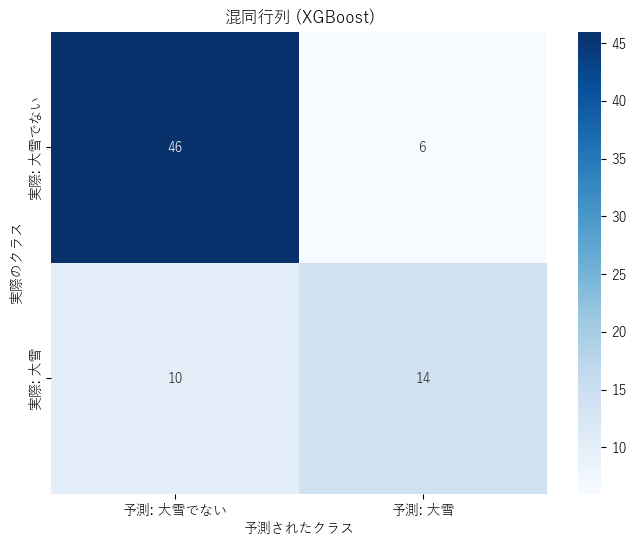

特徴量の重要度 (XGBoost):
      Feature  Importance
0     平均気温(℃)    0.360225
2  降水量の合計(mm)    0.188524
1     最低気温(℃)    0.147175
4     平均湿度(％)    0.107036
5    日照時間(時間)    0.104571
3  平均蒸気圧(hPa)    0.092468


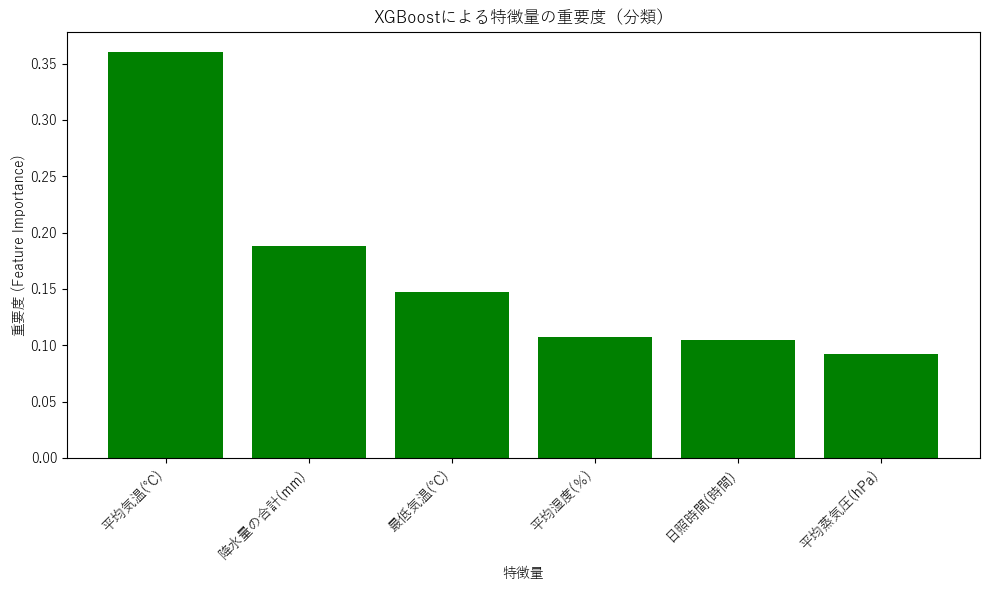

In [8]:
#xgboost
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

mpl.rcParams['font.family'] = 'Yu Gothic'

# --- 2. 説明変数と目的変数の定義 ---
X = numeric_df[['平均気温(℃)', '最低気温(℃)', '降水量の合計(mm)', '平均蒸気圧(hPa)', '平均湿度(％)', '日照時間(時間)']]
y = df['降雪ダミー']

# --- 3. 訓練データとテストデータへの分割 ---
# AdaBoostの時と同様に、stratify=yを指定して分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)


# --- 4. XGBoostモデルの構築と学習 ---
# XGBoost分類モデルを初期化
# XGBClassifierを使用する
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic', # 二値分類問題を指定
    n_estimators=100,            # ブースティングのラウンド数（決定木の数）
    learning_rate=0.1,           # 学習率。一般的にAdaBoostより小さめに設定する
    max_depth=3,                 # 決定木の最大の深さ
    use_label_encoder=False,     # ラベルエンコーダーの使用を無効化（推奨設定）
    eval_metric='logloss',       # 評価指標として対数損失を使用
    random_state=42              # 再現性のための乱数シード
)

# モデルを学習させる
print("XGBoostモデルの学習を開始します...")
xgb_model.fit(X_train, y_train)
print("学習が完了しました。")
print("-" * 30)


# --- 5. テストデータによる予測と評価 ---
# テストデータを使って予測を実行
y_pred = xgb_model.predict(X_test)

# モデルの性能を評価
print("モデルの性能評価:")
print(f"正解率 (Accuracy): {accuracy_score(y_test, y_pred):.3f}")
print("-" * 30)

# 分類レポート
print("分類レポート:")
print(classification_report(y_test, y_pred, target_names=['大雪ではない (0)', '大雪 (1)']))
print("-" * 30)

# 混同行列を作成
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['予測: 大雪でない', '予測: 大雪'],
            yticklabels=['実際: 大雪でない', '実際: 大雪'])
plt.title('混同行列 (XGBoost)')
plt.ylabel('実際のクラス')
plt.xlabel('予測されたクラス')
plt.show()


# --- 6. 結果の可視化と解釈 ---
# どの特徴量が重要だったかを確認（特徴量の重要度）
feature_importances = xgb_model.feature_importances_
importances_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

print("特徴量の重要度 (XGBoost):")
print(importances_df)

# 特徴量の重要度をグラフ化
plt.figure(figsize=(10, 6))
plt.bar(importances_df['Feature'], importances_df['Importance'], color='green')
plt.title('XGBoostによる特徴量の重要度（分類）')
plt.xlabel('特徴量')
plt.ylabel('重要度 (Feature Importance)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

--- データ準備完了 ---
特徴量の数: 6
降雪ダミーの割合:
 降雪ダミー
0    0.690476
1    0.309524
Name: proportion, dtype: float64


--- データ前処理完了 ---
学習データ形状: (201, 1, 6)
テストデータ形状: (51, 1, 6)




Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)                    │ (None, 1, 32)               │             224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 769 (3.00 KB)

 Trainable params: 769 (3.00 KB)

 Non-trainable params: 0 (0.00 B)



計算されたクラスの重み: {0: 0.7230215827338129, 1: 1.6209677419354838}
Epoch 1/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 212ms/step - accuracy: 0.3889 - loss: 0.6861 - val_accuracy: 0.4878 - val_loss: 0.7061
Epoch 2/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.3978 - loss: 0.6708 - val_accuracy: 0.5610 - val_loss: 0.6940
Epoch 3/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.5168 - loss: 0.6616 - val_accuracy: 0.6341 - val_loss: 0.6833
Epoch 4/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.5337 - loss: 0.6476 - val_accuracy: 0.6585 - val_loss: 0.6727
Epoch 5/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.5708 - loss: 0.6451 - val_accuracy: 0.6829 - val_loss: 0.6634
Epoch 6/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.6394 - loss: 0.6268 - val_accuracy: 0.7073 - val_loss: 0.6547
Epoch 7/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.6339 - loss: 0.6027 - val_accuracy: 0.7317 - val_loss: 0.6466
Epoch 8/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0

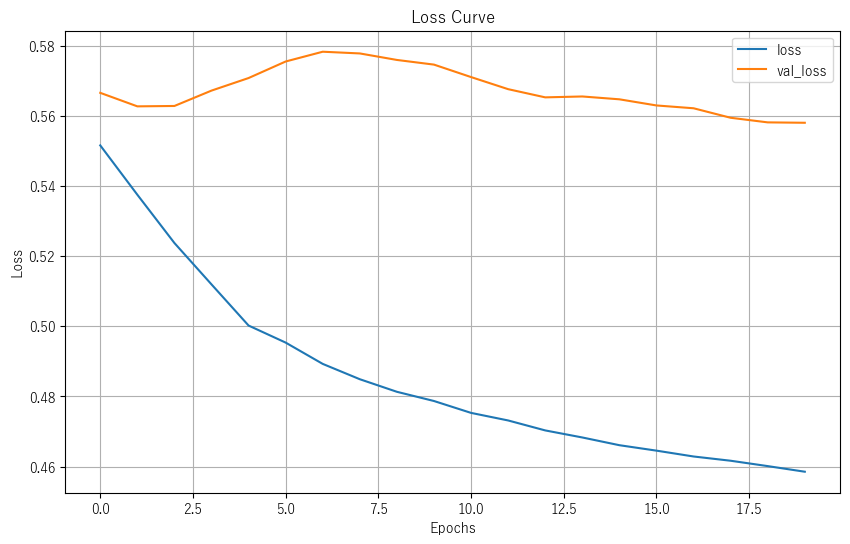

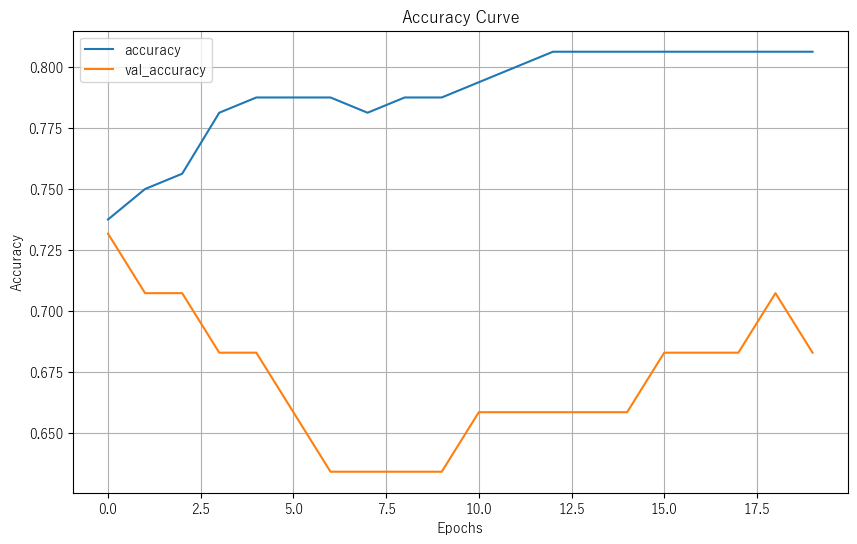

--- モデル評価 ---
Test Accuracy: 0.7843
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/stepWARNING:tensorflow:6 out of the last 6 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x0000024B3CEE01F0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step

Confusion Matrix:


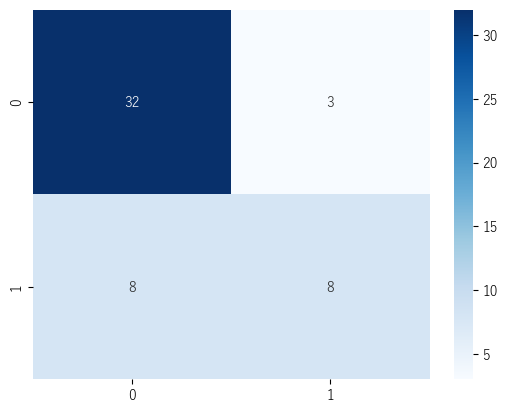


Classification Report:
              precision    recall  f1-score   support

     降雪なし(0)       0.80      0.91      0.85        35
     降雪あり(1)       0.73      0.50      0.59        16

    accuracy                           0.78        51
   macro avg       0.76      0.71      0.72        51
weighted avg       0.78      0.78      0.77        51

--- 特徴量寄与度の分析 ---

サンプル 1 (降雪あり) の予測に対する特徴量寄与度:
      Feature  Gradient  Absolute_Gradient
0     平均気温(℃) -0.151372           0.151372
2  降水量の合計(mm)  0.151349           0.151349
3  平均蒸気圧(hPa) -0.109739           0.109739
5    日照時間(時間) -0.099093           0.099093
1     最低気温(℃)  0.044886           0.044886
4     平均湿度(％) -0.014616           0.014616


C:\Users\ds221k10134\AppData\Local\Temp\ipykernel_6464\354266495.py:183: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Absolute_Gradient', y='Feature', data=feature_importance, palette='viridis')


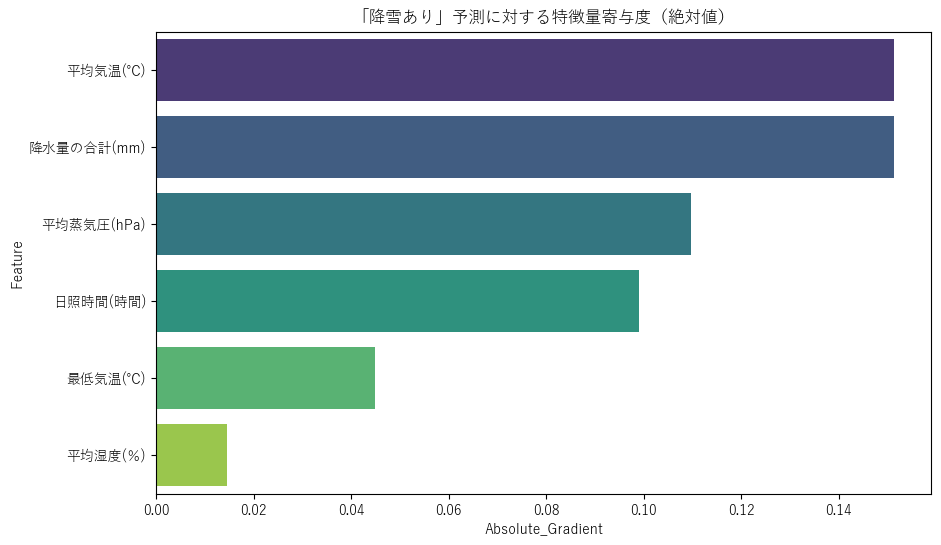

In [19]:
#逆伝搬CNN
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Input
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

original_features = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)']

# 特徴量データ（numeric_dfに相当）
numeric_df = numeric_df[original_features]

print("--- データ準備完了 ---")
print("特徴量の数:", len(original_features))
print("降雪ダミーの割合:\n", df['降雪ダミー'].value_counts(normalize=True))
print("\n")


# --- 1. データの前処理 ---

# 特徴量(X)とターゲット(y)に分割
X = numeric_df.values
y = df['降雪ダミー'].values

# データを学習用とテスト用に分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# 標準化（スケールを揃える）
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# CNNの入力形式に変換 (サンプル数, タイムステップ数, 特徴量数)
# 今回は時系列ではないので、タイムステップは1とする
X_train_cnn = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_cnn = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

print("--- データ前処理完了 ---")
print("学習データ形状:", X_train_cnn.shape)
print("テストデータ形状:", X_test_cnn.shape)
print("\n")


# --- 2. 1D-CNNモデルの構築 ---
model = Sequential([
    Input(shape=(1, len(original_features))),  # 入力層: (タイムステップ数, 特徴量数)
    Conv1D(filters=32, kernel_size=1, activation='relu', padding='same'), # 畳み込み層
    Flatten(), # 1次元に平坦化
    Dense(16, activation='relu'), # 全結合層
    Dense(1, activation='sigmoid') # 出力層 (二値分類なのでsigmoid)
])

# モデルのコンパイル
model.compile(
    optimizer='adam',
    loss='binary_crossentropy', # 二値分類の損失関数
    metrics=['accuracy']
)

model.summary()
print("\n")

from sklearn.utils.class_weight import compute_class_weight

# --- クラスの重みを計算 ---
# y_train（学習データ内のラベル）を使って重みを計算
class_weights = compute_class_weight(
    'balanced',
    classes=np.unique(y_train),
    y=y_train
)
# {0: weight_for_class_0, 1: weight_for_class_1} の形式の辞書に変換
class_weight_dict = dict(enumerate(class_weights))

print("計算されたクラスの重み:", class_weight_dict)


# --- モデルの学習 (引数にclass_weightを追加) ---
history = model.fit(
    X_train_cnn,
    y_train,
    epochs=20,
    batch_size=32,
    validation_split=0.2,
    class_weight=class_weight_dict, # ★★★ この引数を追加 ★★★
    verbose=1
)

# --- 3. モデルの学習 ---
print("--- モデル学習開始 ---")
history = model.fit(
    X_train_cnn,
    y_train,
    epochs=20, # 学習回数
    batch_size=32,
    validation_split=0.2, # 学習データの一部を検証用に使う
    verbose=1
)
print("--- モデル学習完了 ---\n")

# 学習履歴をプロット
history_df = pd.DataFrame(history.history)
history_df[['loss', 'val_loss']].plot(figsize=(10, 6))
plt.title('Loss Curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.show()

history_df[['accuracy', 'val_accuracy']].plot(figsize=(10, 6))
plt.title('Accuracy Curve')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

# --- 4. モデルの評価 ---
print("--- モデル評価 ---")
loss, accuracy = model.evaluate(X_test_cnn, y_test, verbose=0)
print(f"Test Accuracy: {accuracy:.4f}")

# 予測
y_pred_proba = model.predict(X_test_cnn)
y_pred = (y_pred_proba > 0.5).astype(int).flatten()

# 混同行列と分類レポート
print("\nConfusion Matrix:")
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.show()

print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=['降雪なし(0)', '降雪あり(1)']))


# --- 5. 逆伝搬による特徴量の寄与度分析 ---
print("--- 特徴量寄与度の分析 ---")

def get_input_gradients(model, input_sample):
    """
    特定の入力サンプルに対するモデル出力の勾配を計算する（逆伝搬）
    """
    input_tensor = tf.convert_to_tensor(input_sample, dtype=tf.float32)
    
    with tf.GradientTape() as tape:
        tape.watch(input_tensor)
        prediction = model(input_tensor)
    
    # 出力に対する入力の勾配を計算
    gradients = tape.gradient(prediction, input_tensor)
    return gradients.numpy()

# テストデータから「降雪あり」と正しく予測されたサンプルを1つ選ぶ
correct_snow_indices = np.where((y_test == 1) & (y_pred == 1))[0]

if len(correct_snow_indices) > 0:
    sample_index = correct_snow_indices[0]
    sample_input = X_test_cnn[sample_index:sample_index+1] # 形状を(1, 1, 6)に保つ
    
    # 勾配（寄与度）を計算
    gradients = get_input_gradients(model, sample_input)
    
    # 結果を整形してDataFrameにする
    feature_importance = pd.DataFrame({
        'Feature': original_features,
        'Gradient': gradients.flatten() # 勾配を1次元配列に
    })
    feature_importance['Absolute_Gradient'] = np.abs(feature_importance['Gradient'])
    feature_importance = feature_importance.sort_values(by='Absolute_Gradient', ascending=False)
    
    print(f"\nサンプル {sample_index} (降雪あり) の予測に対する特徴量寄与度:")
    print(feature_importance)

    # 寄与度を可視化
    plt.figure(figsize=(10, 6))
    # 日本語フォント設定（環境に合わせて調整）
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = ['Hiragino Maru Gothic Pro', 'Yu Gothic', 'Meirio']
    sns.barplot(x='Absolute_Gradient', y='Feature', data=feature_importance, palette='viridis')
    plt.title('「降雪あり」予測に対する特徴量寄与度（絶対値）')
    plt.show()

else:
    print("\n「降雪あり」と正しく予測されたテストサンプルが見つかりませんでした。")

--- データ準備完了 ---
特徴量の形状: (252, 6)
大雪ダミーの割合:
 大雪ダミー
0    0.944444
1    0.055556
Name: proportion, dtype: float64


--- データ前処理完了 ---
学習データ形状: (201, 1, 6)


計算されたクラスの重み: {0: 0.5289473684210526, 1: 9.136363636363637}


--- ハイパーパラメータ探索開始 ---
--- ハイパーパラメータ探索完了 ---


最適なハイパーパラメータ:
- Filters: 128
- Units: 64
- Learning Rate: 0.01


--- 最適なモデルで再学習開始 ---
--- 再学習完了 ---


--- 最終モデルの評価 ---
Test Accuracy: 0.9020
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

--- 決定閾値 0.8 での評価 ---
              precision    recall  f1-score   support

   大雪ではない(0)       0.98      0.98      0.98        48
     大雪あり(1)       0.67      0.67      0.67         3

    accuracy                           0.96        51
   macro avg       0.82      0.82      0.82        51
weighted avg       0.96      0.96      0.96        51


Confusion Matrix:


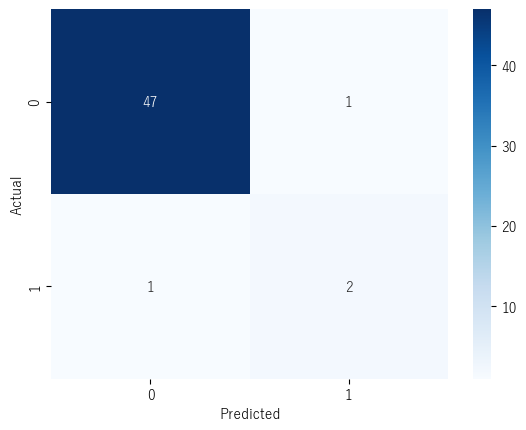


Classification Report:
              precision    recall  f1-score   support

     降雪なし(0)       0.98      0.98      0.98        48
     降雪あり(1)       0.67      0.67      0.67         3

    accuracy                           0.96        51
   macro avg       0.82      0.82      0.82        51
weighted avg       0.96      0.96      0.96        51



--- 特徴量寄与度の分析 ---

---「降雪あり」と正しく予測された全サンプルにおける平均的な特徴量寄与度 ---
      Feature  Mean_Absolute_Gradient
2  降水量の合計(mm)                0.575627
5    日照時間(時間)                0.288223
0     平均気温(℃)                0.248664
3  平均蒸気圧(hPa)                0.189909
1     最低気温(℃)                0.077658
4     平均湿度(％)                0.077234


C:\Users\ds221k10134\AppData\Local\Temp\ipykernel_3976\2607865495.py:197: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Mean_Absolute_Gradient', y='Feature', data=feature_importance_avg, palette='plasma')


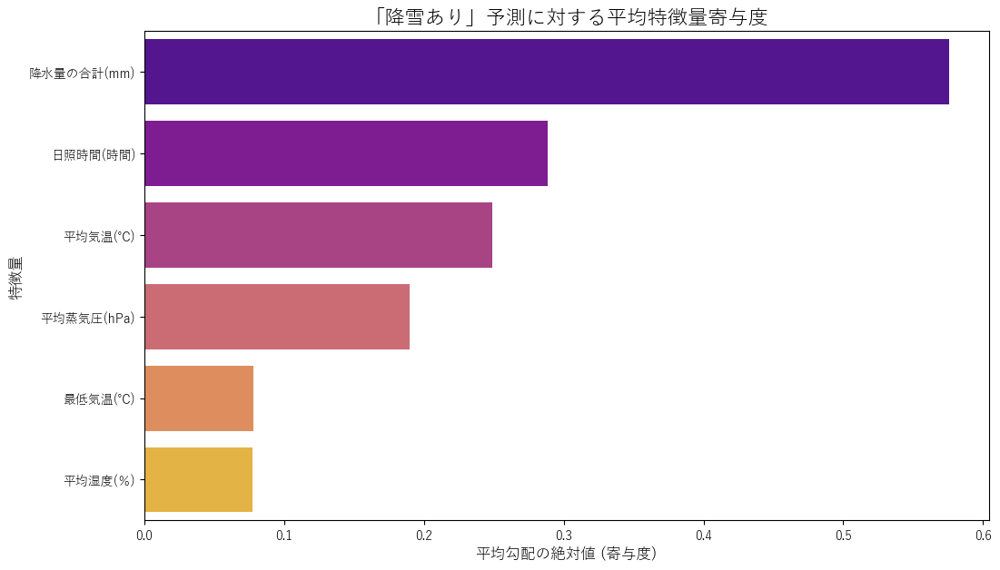

In [21]:
#KerasTunerを導入した誤差伝搬CNN
# --- 必要なライブラリのインポート ---
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Input
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import keras_tuner as kt
import warnings

# TensorFlowのINFOレベル以下のログを抑制
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
warnings.filterwarnings('ignore', category=UserWarning, module='tensorflow')


# --- 0. サンプルデータの準備 ---
# この部分はご自身のデータ読み込みに置き換えてください。
original_features = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)']


# 特徴量データ
numeric_df = numeric_df[original_features]

print("--- データ準備完了 ---")
print("特徴量の形状:", numeric_df.shape)
print("大雪ダミーの割合:\n", df['大雪ダミー'].value_counts(normalize=True))
print("\n" + "="*50 + "\n")

# --- 1. データの前処理 ---
X = numeric_df.values
y = df['大雪ダミー'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_cnn = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_cnn = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

print("--- データ前処理完了 ---")
print("学習データ形状:", X_train_cnn.shape)
print("\n" + "="*50 + "\n")

# クラスの不均衡に対処するための重みを計算
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))
print("計算されたクラスの重み:", class_weight_dict)
print("\n" + "="*50 + "\n")


# --- 2. KerasTuner: モデル構築関数の定義 ---
def build_model(hp):
    # hp (HyperParameters)オブジェクトを使って探索範囲を定義
    hp_filters = hp.Int('filters', min_value=32, max_value=128, step=32)
    hp_units = hp.Int('units', min_value=16, max_value=64, step=16)
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    model = Sequential([
        Input(shape=(1, len(original_features))),
        Conv1D(filters=hp_filters, kernel_size=1, activation='relu', padding='same'),
        Flatten(),
        Dense(units=hp_units, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model


# --- 3. KerasTuner: チューナーの設定と探索の実行 ---
tuner = kt.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=10, 
    executions_per_trial=2,
    # ★★★ 修正点 ★★★
    # 保存先を日本語を含まない絶対パスに指定する
    directory=r"C:\Users\ds221k10134\Downloads",
    project_name='snow_classification_tuning',
    overwrite=True 
)

print("--- ハイパーパラメータ探索開始 ---")
tuner.search(
    X_train_cnn, 
    y_train, 
    epochs=15,
    validation_split=0.2, 
    class_weight=class_weight_dict,
    verbose=0 # 探索中のログは非表示に
)
print("--- ハイパーパラメータ探索完了 ---")
print("\n" + "="*50 + "\n")


# --- 4. KerasTuner: 最適なモデルでの再学習 ---
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"""最適なハイパーパラメータ:
- Filters: {best_hps.get('filters')}
- Units: {best_hps.get('units')}
- Learning Rate: {best_hps.get('learning_rate')}
\n""")

# 最適なハイパーパラメータでモデルを再構築
best_model = tuner.hypermodel.build(best_hps)

print("--- 最適なモデルで再学習開始 ---")
history = best_model.fit(
    X_train_cnn, 
    y_train, 
    epochs=50, # エポック数を増やしてしっかり学習
    validation_data=(X_test_cnn, y_test), 
    class_weight=class_weight_dict,
    verbose=0 # 学習中のログは非表示に
)
print("--- 再学習完了 ---")
print("\n" + "="*50 + "\n")


# --- 5. モデルの評価 ---
print("--- 最終モデルの評価 ---")
loss, accuracy = best_model.evaluate(X_test_cnn, y_test, verbose=0)
print(f"Test Accuracy: {accuracy:.4f}")

y_pred_proba = best_model.predict(X_test_cnn)
# ★★★ 決定閾値を0.5から変更してみる ★★★
threshold = 0.8 
y_pred = (y_pred_proba > threshold).astype(int).flatten()

# 閾値を変更した後の性能を確認
print(f"\n--- 決定閾値 {threshold} での評価 ---")
print(classification_report(y_test, y_pred, target_names=['大雪ではない(0)', '大雪あり(1)']))

print("\nConfusion Matrix:")
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=['降雪なし(0)', '降雪あり(1)']))
print("\n" + "="*50 + "\n")


# --- 6. 逆伝搬による特徴量寄与度の分析 ---
print("--- 特徴量寄与度の分析 ---")

@tf.function
def get_input_gradients(model, input_tensor):
    """ 特定の入力サンプルに対するモデル出力の勾配を計算する（逆伝搬）"""
    with tf.GradientTape() as tape:
        tape.watch(input_tensor)
        prediction = model(input_tensor, training=False)
    gradients = tape.gradient(prediction, input_tensor)
    return gradients

# 「降雪あり」と正しく予測された全サンプルのインデックスを取得
correct_snow_indices = np.where((y_test == 1) & (y_pred == 1))[0]

if len(correct_snow_indices) > 0:
    all_gradients = []
    for idx in correct_snow_indices:
        sample_input = tf.convert_to_tensor(X_test_cnn[idx:idx+1], dtype=tf.float32)
        gradients = get_input_gradients(best_model, sample_input)
        all_gradients.append(gradients.numpy().flatten())
        
    # 勾配の絶対値の平均を計算
    mean_abs_gradients = np.mean(np.abs(all_gradients), axis=0)
    
    # 結果をDataFrameに
    feature_importance_avg = pd.DataFrame({
        'Feature': original_features,
        'Mean_Absolute_Gradient': mean_abs_gradients
    }).sort_values(by='Mean_Absolute_Gradient', ascending=False)
    
    print("\n---「降雪あり」と正しく予測された全サンプルにおける平均的な特徴量寄与度 ---")
    print(feature_importance_avg)

    # 寄与度を可視化
    plt.figure(figsize=(12, 7))
    # 日本語フォント設定（環境に合わせて調整してください）
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = ['Hiragino Maru Gothic Pro', 'Yu Gothic', 'Meirio', 'Takao', 'IPAexGothic', 'IPAPGothic', 'sans-serif']
    sns.barplot(x='Mean_Absolute_Gradient', y='Feature', data=feature_importance_avg, palette='plasma')
    plt.title('「降雪あり」予測に対する平均特徴量寄与度', fontsize=16)
    plt.xlabel('平均勾配の絶対値 (寄与度)', fontsize=12)
    plt.ylabel('特徴量', fontsize=12)
    plt.show()
else:
    print("\n「降雪あり」と正しく予測されたテストサンプルが見つかりませんでした。")

In [ ]:
それぞれ２つのの分類モデルで注目されている特徴量の重要度は
CNN:{降水量>>日照時間>平均気温>平均気圧>最低気温=平均湿度}
LigthGBM(gain):{平均気温>>降水量>>最低気温>平均気圧>日照時間>平均湿度}
こんな感じでした。

In [ ]:
32種類の特徴抽出器で気象データからパターンを読み取り、それを48個のニューロンで統合・判断し、学習の際には0.01という比較的大きな歩幅で間違いを修正していく

In [ ]:
`KerasTuner`は、指定した範囲内でCNNのフィルター数や全結合層のユニット数、学習率などを自動で様々に試し、最も性能の良い組み合わせを見つけ出してくれます。

--- データ準備完了 ---
特徴量の形状: (252, 6)
大雪ダミーの割合:
 大雪ダミー
0    0.944444
1    0.055556
Name: proportion, dtype: float64


SMOTE適用前の学習データ数: (201, 6)
SMOTE適用後の学習データ数: (380, 6)
SMOTE適用後のラベルの割合:
 0    190
1    190
Name: count, dtype: int64
--- データ前処理完了 ---
学習データ形状: (380, 1, 6)


--- ハイパーパラメータ探索開始 ---


C:\Users\ds221k10134\Downloads\個人探究\venv_analysis\lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


--- ハイパーパラメータ探索完了 ---


最適なハイパーパラメータ:
- Filters: 64
- Units: 16
- Learning Rate: 0.01


--- 最適なモデルで再学習開始 ---
--- 再学習完了 ---


--- 最終モデルの評価 ---
Test Accuracy: 0.9608
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

--- 決定閾値 0.5 での評価 ---
              precision    recall  f1-score   support

   大雪ではない(0)       0.96      1.00      0.98        48
     大雪あり(1)       1.00      0.33      0.50         3

    accuracy                           0.96        51
   macro avg       0.98      0.67      0.74        51
weighted avg       0.96      0.96      0.95        51


Confusion Matrix:


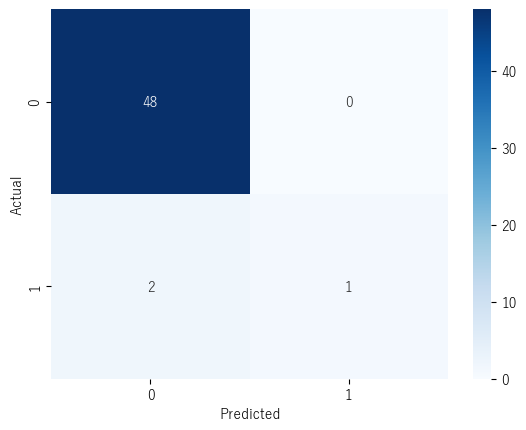


Classification Report:
              precision    recall  f1-score   support

     降雪なし(0)       0.96      1.00      0.98        48
     降雪あり(1)       1.00      0.33      0.50         3

    accuracy                           0.96        51
   macro avg       0.98      0.67      0.74        51
weighted avg       0.96      0.96      0.95        51



--- 特徴量寄与度の分析 ---

---「降雪あり」と正しく予測された全サンプルにおける平均的な特徴量寄与度 ---
      Feature  Mean_Absolute_Gradient
2  降水量の合計(mm)                0.505705
0     平均気温(℃)                0.202406
5    日照時間(時間)                0.183648
3  平均蒸気圧(hPa)                0.143928
1     最低気温(℃)                0.042570
4     平均湿度(％)                0.006297


C:\Users\ds221k10134\AppData\Local\Temp\ipykernel_3976\3128365561.py:207: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Mean_Absolute_Gradient', y='Feature', data=feature_importance_avg, palette='plasma')


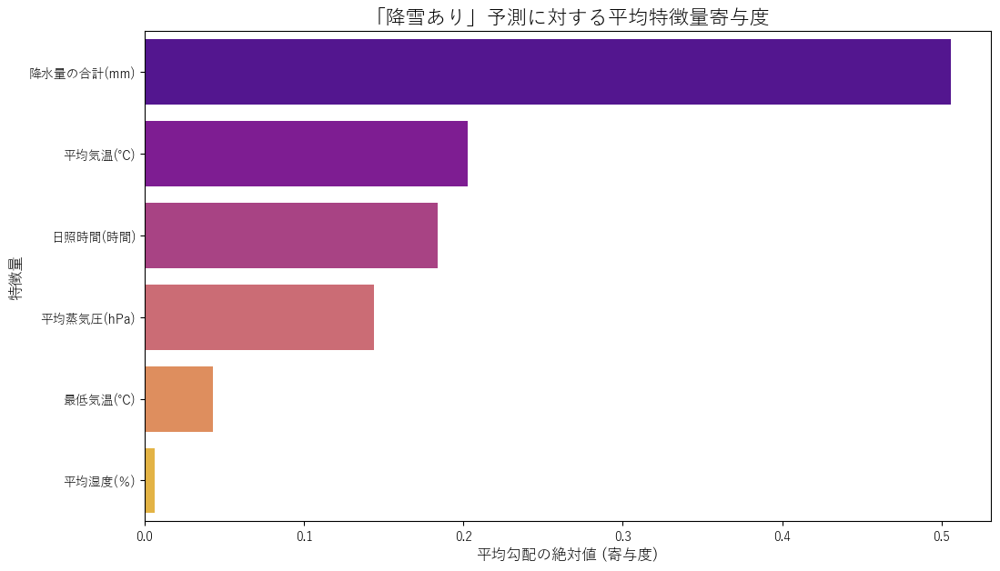

In [23]:
#KerasTunerとSMOTEを導入した逆伝搬CNN
# --- 必要なライブラリのインポート ---
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Input
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
import seaborn as sns
import keras_tuner as kt
import warnings
from imblearn.over_sampling import SMOTE

# TensorFlowのINFOレベル以下のログを抑制
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
warnings.filterwarnings('ignore', category=UserWarning, module='tensorflow')


# --- 0. サンプルデータの準備 ---
# この部分はご自身のデータ読み込みに置き換えてください。
original_features = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)']


# 特徴量データ
numeric_df = numeric_df[original_features]

print("--- データ準備完了 ---")
print("特徴量の形状:", numeric_df.shape)
print("大雪ダミーの割合:\n", df['大雪ダミー'].value_counts(normalize=True))
print("\n" + "="*50 + "\n")

# --- 1. データの前処理 ---
X = numeric_df.values
y = df['大雪ダミー'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_cnn = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_cnn = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# X_train_scaled と y_train をSMOTEに適用
# 注意：CNNの入力形式に変える前の、2次元のデータに適用します
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

print("SMOTE適用前の学習データ数:", X_train_scaled.shape)
print("SMOTE適用後の学習データ数:", X_train_resampled.shape)
print("SMOTE適用後のラベルの割合:\n", pd.Series(y_train_resampled).value_counts())

# SMOTEで生成した新しい学習データを使って、CNNの入力形式に変換
X_train_cnn = X_train_resampled.reshape((X_train_resampled.shape[0], 1, X_train_resampled.shape[1]))
y_train = y_train_resampled # yもリサンプリング後のものを使う

# ★重要★
# データ数が均等になったので、class_weightは不要になります。
# model.fit()の class_weight 引数を削除してください。

print("--- データ前処理完了 ---")
print("学習データ形状:", X_train_cnn.shape)
print("\n" + "="*50 + "\n")


# --- 2. KerasTuner: モデル構築関数の定義 ---
def build_model(hp):
    # hp (HyperParameters)オブジェクトを使って探索範囲を定義
    hp_filters = hp.Int('filters', min_value=32, max_value=128, step=32)
    hp_units = hp.Int('units', min_value=16, max_value=64, step=16)
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    model = Sequential([
        Input(shape=(1, len(original_features))),
        Conv1D(filters=hp_filters, kernel_size=1, activation='relu', padding='same'),
        Flatten(),
        Dense(units=hp_units, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model


# --- 3. KerasTuner: チューナーの設定と探索の実行 ---
tuner = kt.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=10, 
    executions_per_trial=2,
    # ★★★ 修正点 ★★★
    # 保存先を日本語を含まない絶対パスに指定する
    directory=r"C:\Users\ds221k10134\Downloads",
    project_name='snow_classification_tuning',
    overwrite=True 
)

print("--- ハイパーパラメータ探索開始 ---")
tuner.search(
    X_train_cnn, 
    y_train, 
    epochs=15,
    validation_split=0.2, 
    verbose=0 # 探索中のログは非表示に
)
print("--- ハイパーパラメータ探索完了 ---")
print("\n" + "="*50 + "\n")


# --- 4. KerasTuner: 最適なモデルでの再学習 ---
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"""最適なハイパーパラメータ:
- Filters: {best_hps.get('filters')}
- Units: {best_hps.get('units')}
- Learning Rate: {best_hps.get('learning_rate')}
\n""")

# 最適なハイパーパラメータでモデルを再構築
best_model = tuner.hypermodel.build(best_hps)

print("--- 最適なモデルで再学習開始 ---")
history = best_model.fit(
    X_train_cnn, 
    y_train, 
    epochs=50, # エポック数を増やしてしっかり学習
    validation_data=(X_test_cnn, y_test), 
    verbose=0 # 学習中のログは非表示に
)
print("--- 再学習完了 ---")
print("\n" + "="*50 + "\n")


# --- 5. モデルの評価 ---
print("--- 最終モデルの評価 ---")
loss, accuracy = best_model.evaluate(X_test_cnn, y_test, verbose=0)
print(f"Test Accuracy: {accuracy:.4f}")

y_pred_proba = best_model.predict(X_test_cnn)
# ★★★ 決定閾値を0.5から変更してみる ★★★
threshold = 0.5 
y_pred = (y_pred_proba > threshold).astype(int).flatten()

# 閾値を変更した後の性能を確認
print(f"\n--- 決定閾値 {threshold} での評価 ---")
print(classification_report(y_test, y_pred, target_names=['大雪ではない(0)', '大雪あり(1)']))

print("\nConfusion Matrix:")
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=['降雪なし(0)', '降雪あり(1)']))
print("\n" + "="*50 + "\n")


# --- 6. 逆伝搬による特徴量寄与度の分析 ---
print("--- 特徴量寄与度の分析 ---")

@tf.function
def get_input_gradients(model, input_tensor):
    """ 特定の入力サンプルに対するモデル出力の勾配を計算する（逆伝搬）"""
    with tf.GradientTape() as tape:
        tape.watch(input_tensor)
        prediction = model(input_tensor, training=False)
    gradients = tape.gradient(prediction, input_tensor)
    return gradients

# 「降雪あり」と正しく予測された全サンプルのインデックスを取得
correct_snow_indices = np.where((y_test == 1) & (y_pred == 1))[0]

if len(correct_snow_indices) > 0:
    all_gradients = []
    for idx in correct_snow_indices:
        sample_input = tf.convert_to_tensor(X_test_cnn[idx:idx+1], dtype=tf.float32)
        gradients = get_input_gradients(best_model, sample_input)
        all_gradients.append(gradients.numpy().flatten())
        
    # 勾配の絶対値の平均を計算
    mean_abs_gradients = np.mean(np.abs(all_gradients), axis=0)
    
    # 結果をDataFrameに
    feature_importance_avg = pd.DataFrame({
        'Feature': original_features,
        'Mean_Absolute_Gradient': mean_abs_gradients
    }).sort_values(by='Mean_Absolute_Gradient', ascending=False)
    
    print("\n---「降雪あり」と正しく予測された全サンプルにおける平均的な特徴量寄与度 ---")
    print(feature_importance_avg)

    # 寄与度を可視化
    plt.figure(figsize=(12, 7))
    # 日本語フォント設定（環境に合わせて調整してください）
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = ['Hiragino Maru Gothic Pro', 'Yu Gothic', 'Meirio', 'Takao', 'IPAexGothic', 'IPAPGothic', 'sans-serif']
    sns.barplot(x='Mean_Absolute_Gradient', y='Feature', data=feature_importance_avg, palette='plasma')
    plt.title('「降雪あり」予測に対する平均特徴量寄与度', fontsize=16)
    plt.xlabel('平均勾配の絶対値 (寄与度)', fontsize=12)
    plt.ylabel('特徴量', fontsize=12)
    plt.show()
else:
    print("\n「降雪あり」と正しく予測されたテストサンプルが見つかりませんでした。")

--- データ準備完了 ---


--- LightGBMモデルの学習と評価 ---
LightGBM scale_pos_weight: 2.24

--- モデルの学習 ---
[LightGBM] [Info] Number of positive: 62, number of negative: 139
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 201, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.308458 -> initscore=-0.807340
[LightGBM] [Info] Start training from score -0.807340
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

C:\Users\ds221k10134\Downloads\個人探究\venv_analysis\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


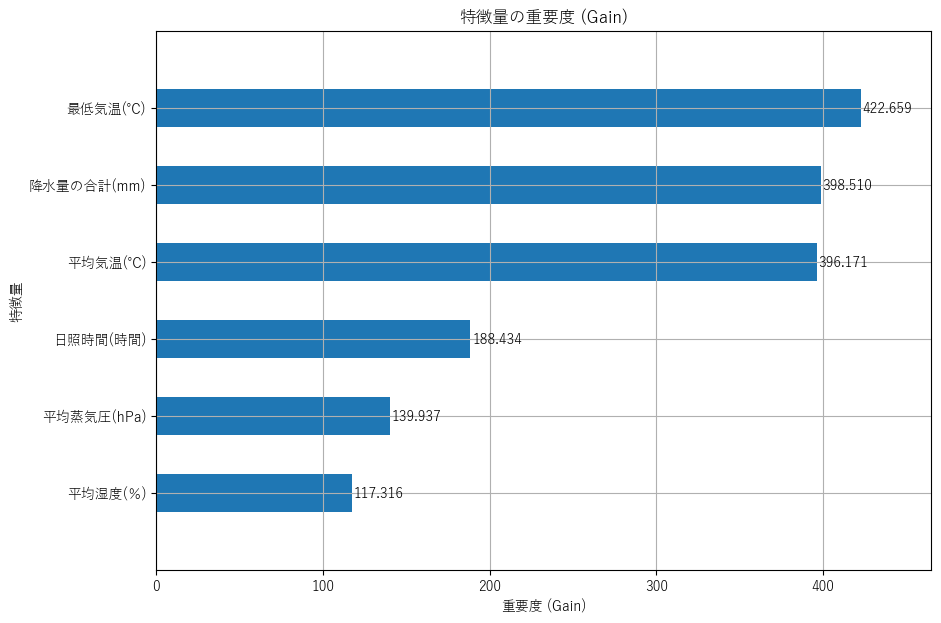

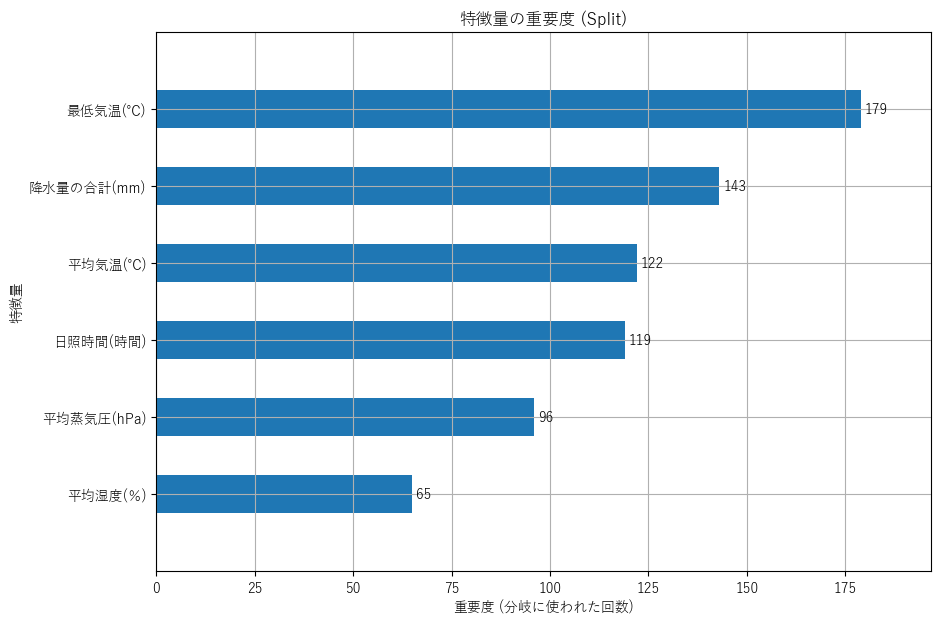

In [8]:
#LigthGBMによる降雪ダミー分類
import pandas as pd
import numpy as np
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

# --- 0. データの準備 ---
# (サンプルデータで代用)
original_features = ['平均気温(℃)','最低気温(℃)','降水量の合計(mm)','平均蒸気圧(hPa)','平均湿度(％)','日照時間(時間)']

numeric_dff = df[original_features]

print("--- データ準備完了 ---")
# (以下、print文は省略)


# --- 1. データの前処理 ---
X = numeric_dff.values
y = df['降雪ダミー'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


# --- 2. LightGBMモデルの学習と評価 ---
print("\n" + "="*50 + "\n")
print("--- LightGBMモデルの学習と評価 ---")

scale_pos_weight_value = ( (y_train == 0).sum() / (y_train == 1).sum() )
print(f"LightGBM scale_pos_weight: {scale_pos_weight_value:.2f}")

lgbm = lgb.LGBMClassifier(
    objective='binary',
    scale_pos_weight=scale_pos_weight_value,
    random_state=42
)

# ★★★★★★★★★★★★★★★★★★★★★★★★★★★★★
# 修正点：最初の学習で、特徴量名を設定する
# ★★★★★★★★★★★★★★★★★★★★★★★★★★★★★
print("\n--- モデルの学習 ---")
lgbm.fit(
    X_train_scaled, 
    y_train,
    feature_name=original_features  # 特徴量名のリストをここで指定
)


# --- 3. モデルの評価（閾値調整を含む） ---
# 学習済みの lgbm モデルを使って予測を行う
y_pred_proba_lgbm = lgbm.predict_proba(X_test_scaled)

# 閾値を調整して評価
threshold = 0.7
y_pred_lgbm_tuned = (y_pred_proba_lgbm[:, 1] > threshold).astype(int)
print(f"\n--- LightGBM (閾値 {threshold}) Classification Report ---")
print(classification_report(y_test, y_pred_lgbm_tuned, target_names=['大雪ではない(0)', '大雪あり(1)']))

# (参考) デフォルトの閾値(0.5)での評価
#y_pred_lgbm_default = lgbm.predict(X_test_scaled)
#print("\n--- LightGBM (デフォルト閾値) Classification Report ---")
#print(classification_report(y_test, y_pred_lgbm_default, target_names=['大雪ではない(0)', '大雪あり(1)']))


# --- 4. 特徴量の重要度を可視化 ---
print("\n--- LightGBM 特徴量重要度の可視化 ---")

# 日本語フォントの設定
plt.rcParams['font.family'] = 'Yu Gothic' # または 'Meirio' など

# importance_type='gain' でプロット
lgb.plot_importance(
    lgbm, 
    height=0.5, 
    figsize=(10, 7), 
    title="特徴量の重要度 (Gain)",
    xlabel="重要度 (Gain)",
    ylabel="特徴量",
    importance_type='gain'
)
plt.show()

# (参考) importance_type='split' でプロット
lgb.plot_importance(
    lgbm, 
    height=0.5, 
    figsize=(10, 7), 
    title="特徴量の重要度 (Split)",
    xlabel="重要度 (分岐に使われた回数)",
    ylabel="特徴量",
    importance_type='split'
)
plt.show()

In [ ]:
【結論】
LightGBMとCNNモデルと全く同等の性能を達成'''
閾値を0.3に調整したLightGBMは、precision, recall, f1-scoreのすべてにおいて、苦労して最適化したCNNモデルと完全に同じスコアになりました。
これは、**「LightGBMもCNNと同等の予測性能を持つポテンシャルがある」**ということを明確に示しています。
異なるアプローチで同じ結論に到達
CNNは、画像認識のように特徴を自動で抽出し組み合わせるアプローチでした。
LightGBMは、決定木をベースに特徴量の値を細かく分割していくアプローチです。
全く異なる2つの手法が、最終的に同じ性能評価に至ったということは、この f1-score: 0.67 というのが、現在の特徴量セットで達成できる、
かなり信頼性の高い性能限界である可能性を示唆しています。'''
今回の分析を通じて、以下の非常に重要な結論が得られました。
モデルの性能限界:
現在の6つの特徴量を使った場合、f1-scoreで約67%というのが、大雪を予測する上での現実的な性能限界である可能性が高いです。　by Gemini 2.5 pro

In [20]:
df[df["大雪ダミー"]==0].info()

<class 'pandas.core.frame.DataFrame'>
Index: 238 entries, 0 to 251
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        238 non-null    datetime64[ns]
 1   平均気温(℃)     238 non-null    float64       
 2   最低気温(℃)     238 non-null    float64       
 3   降水量の合計(mm)  238 non-null    float64       
 4   平均蒸気圧(hPa)  238 non-null    float64       
 5   平均湿度(％)     238 non-null    int64         
 6   日照時間(時間)    238 non-null    float64       
 7   降雪量合計(cm)   238 non-null    int64         
 8   大雪ダミー       238 non-null    int64         
 9   降雪ダミー       238 non-null    int64         
 10  year        238 non-null    int32         
 11  month       238 non-null    int32         
dtypes: datetime64[ns](1), float64(5), int32(2), int64(4)
memory usage: 22.3 KB
